In [1]:
Sys.setenv(RETICULATE_PYTHON = "/home/gonglihao/miniconda3/envs/42/bin/python")
suppressPackageStartupMessages({
    library("dplyr")
    library("Matrix")
    library("Seurat")
    library("SeuratWrappers")
    library("tictoc")
    library("ggplot2")
    library("ggpubr")
    library("future")
    library("SingleR")
    library("pheatmap")
})

In [2]:
tic()
load("/data3/Group8/gonglihao/1-MMP9/1-QC/shNC.rda")
toc()

17.759 sec elapsed


In [3]:
tic()
ref <- celldex::ImmGenData()
mat <- GetAssayData(seu, layer="data")
pred.immgen.fine <- SingleR(test = mat, ref = ref, labels = ref$label.fine)
pred.immgen.main <- SingleR(test = mat, ref = ref, labels = ref$label.main)

seu[["pred.immgen.fine"]]      <-pred.immgen.fine$labels
seu[["pred.immgen.finepruned"]]<-pred.immgen.fine$pruned.labels

seu[["pred.immgen.main"]]      <-pred.immgen.main$labels
seu[["pred.immgen.mainpruned"]]<-pred.immgen.main$pruned.labels
toc()

306.832 sec elapsed


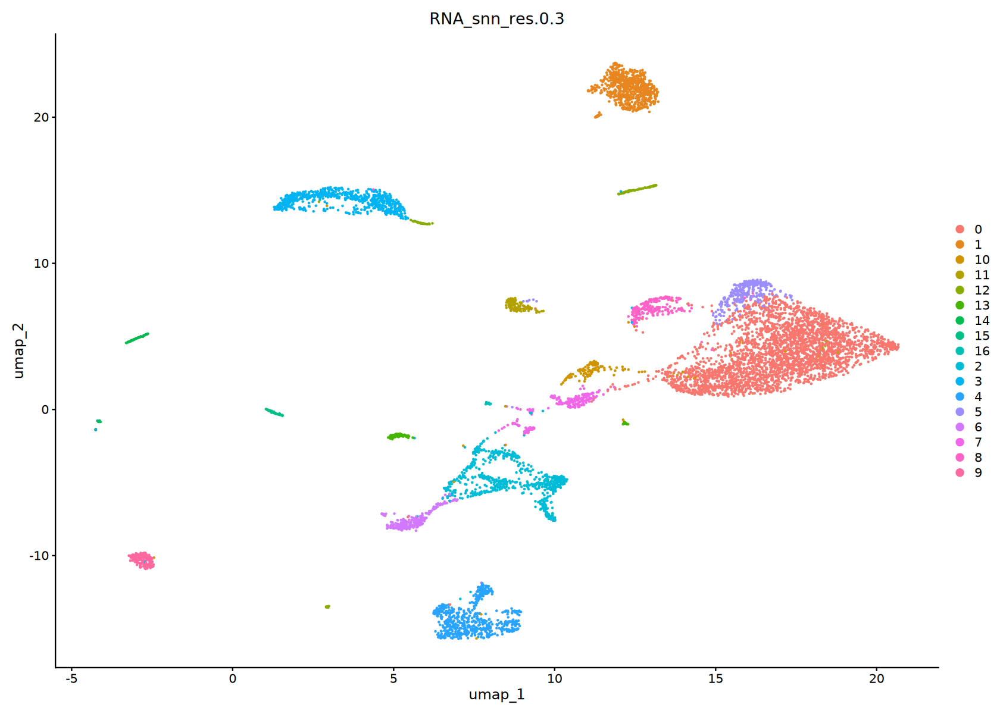

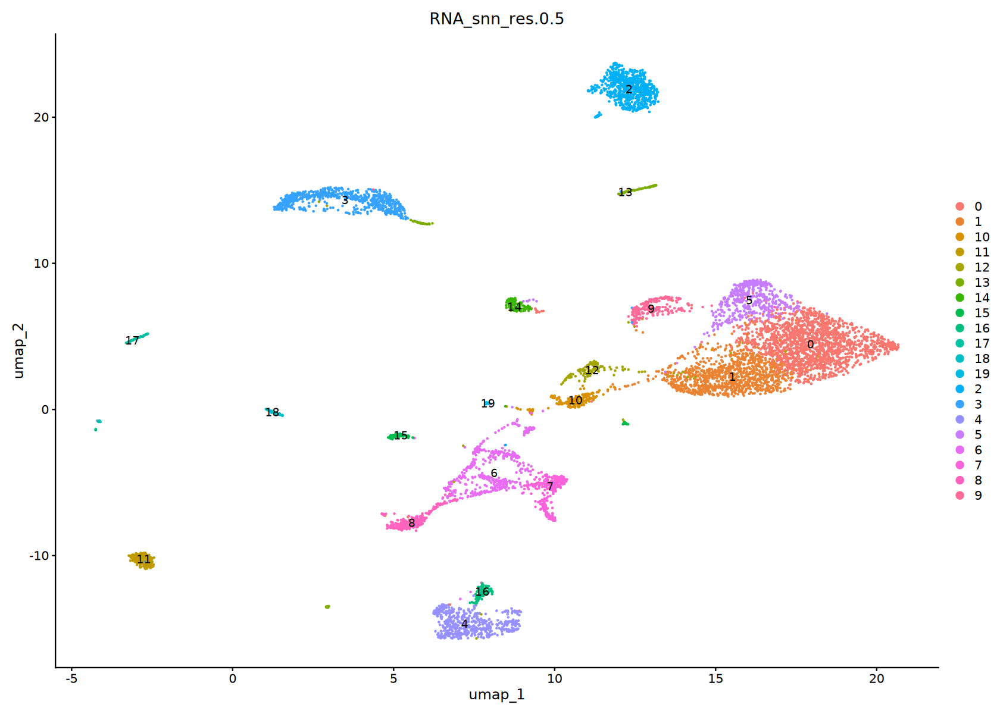

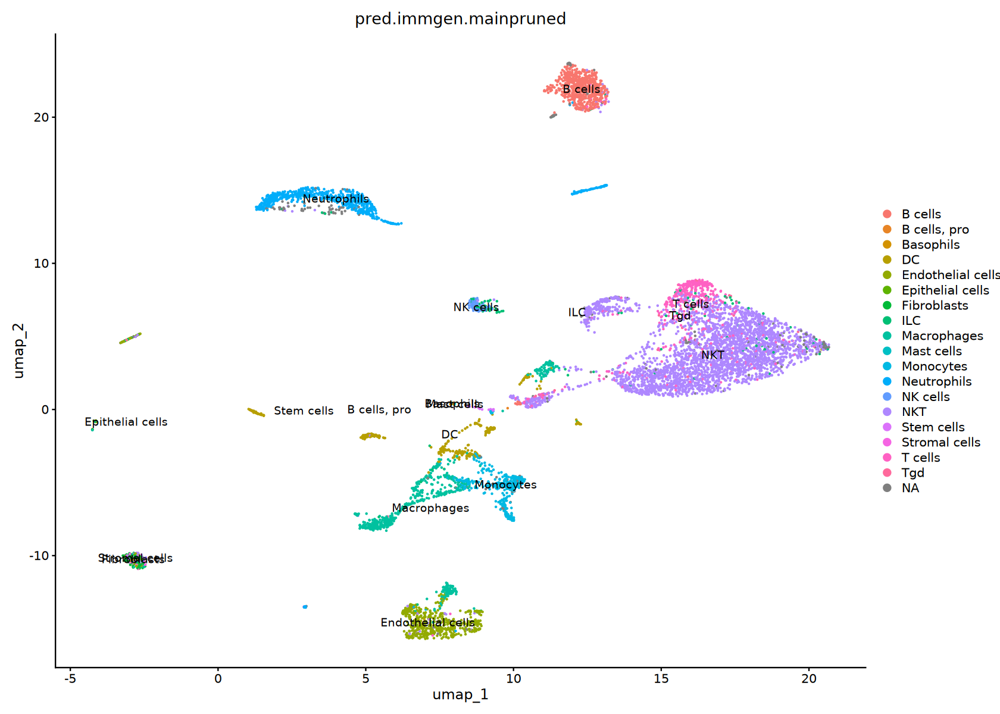

In [4]:
options(repr.plot.width=14, repr.plot.height=10)
DimPlot(seu, group.by="RNA_snn_res.0.3")
DimPlot(seu, group.by="RNA_snn_res.0.5", label=T)
DimPlot(seu, group.by="pred.immgen.mainpruned", label=T)

In [5]:
seu->seu.all

# note that cell clusters that are of interests under RNA_snn_res.0.5
# c(0,1,3,5,6,7,8,9,4 16 )

In [6]:
Idents(seu)<-"RNA_snn_res.0.5"
tic("DE")
markers <- FindAllMarkers(seu, only.pos = FALSE, min.pct = 0.25, 
                          logfc.threshold = 0.25, return.thresh = 0.01)
toc()

Calculating cluster 0

Calculating cluster 1

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17

Calculating cluster 18

Calculating cluster 19

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9



DE: 68.471 sec elapsed


In [7]:
# Filter
markers <- markers[ markers$p_val_adj<0.01, ]
# Sort
markers <- markers[ order(markers$cluster, -markers$avg_log2FC), ]

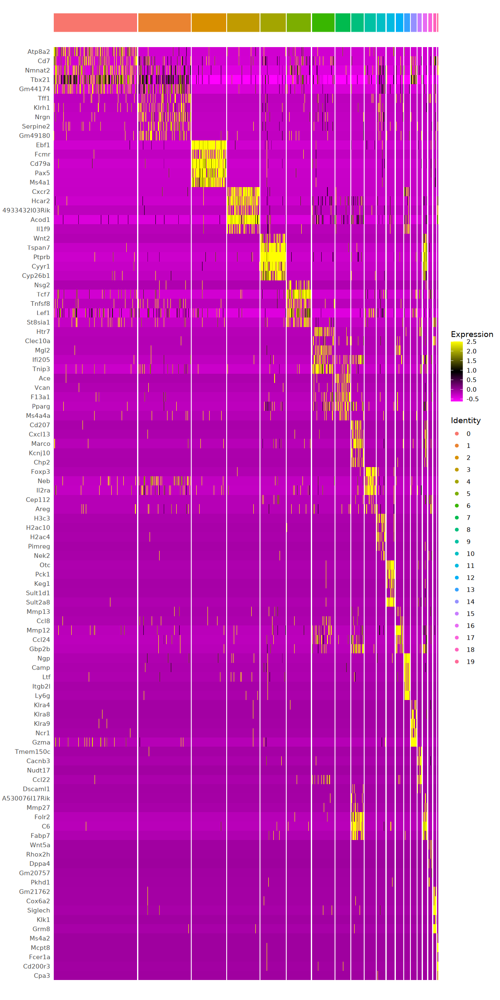

In [8]:
# First reorder clusters
seu$RNA_snn_res.0.5 <- factor(seu$RNA_snn_res.0.5,
                              levels = sort(as.numeric(as.character(unique(seu$RNA_snn_res.0.5)))))
Idents(seu) <- seu$RNA_snn_res.0.5

# Then reorder markers
markers$cluster <- factor(markers$cluster,
                         levels = sort(as.numeric(as.character(unique(markers$cluster)))))

# Get top genes and make sure they're ordered by cluster
markers.top <- markers %>%
  group_by(cluster) %>%
  top_n(n = 5, wt = avg_log2FC) %>%
  arrange(cluster)  # This ensures sorting

# Convert to a vector in proper order
features_ordered <- markers.top %>%
  arrange(cluster) %>%
  pull(gene)

# Plot with ordered features
options(repr.plot.width=10, repr.plot.height=20)
DoHeatmap(seu, features = features_ordered, label=F)

In [9]:
seu0<-subset(seu, RNA_snn_res.0.5==0)
markers.top[markers.top$cluster==0, ]

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
2.044112e-215,3.738127,0.331,0.061,6.388463e-211,0,Atp8a2
1.419153e-92,2.545452,0.259,0.086,4.435279e-88,0,Cd7
1.223203e-126,2.379640,0.357,0.129,3.822875e-122,0,Nmnat2
1.468219e-233,2.287495,0.601,0.250,4.588626e-229,0,Tbx21
1.015120e-66,2.172861,0.271,0.120,3.172553e-62,0,Gm44174


In [10]:
cluster_names <- unique(sort(seu@meta.data$"RNA_snn_res.0.5"))
seu_subsets <-list()
for (cluster in cluster_names){
    cluster<-as.character(cluster)
    seu_subsets[[cluster]]<-subset(seu, RNA_snn_res.0.5==cluster)
}

putative_doublets<-c()

# C0

In [11]:
seu <- seu_subsets[["0"]]

tic("Renormalization and Dimensionality reduction")
seu  <- NormalizeData(seu,  normalization.method="LogNormalize", scale.factor=10000, block.size=800)
seu  <- FindVariableFeatures(seu,  selection.method = "vst", nfeatures = 2000)

plan("multicore", workers = 54)
options(future.globals.maxSize = Inf)
seu <- ScaleData(seu,  features=rownames(seu), block.size = 500, min.cells.to.block = 1000)
plan("sequential")

seu <- RunPCA(seu,  npcs=30, features=VariableFeatures(object=seu),  verbose = FALSE)
seu <- RunUMAP(object=seu,  dims=1:30, verbose=FALSE, min.dist=0.5, n.neighbors = 30L, umap.method = "umap-learn", metric = "correlation")
toc()

seu <- FindNeighbors(seu, dims = 1:10, graph.name = 'leiden')
seu <- FindClusters(seu, resolution = c(0.1,0.3,0.5,0.7,0.9,1.2), algorithm=4, n.iter=100, group.singletons=T,graph.name = 'leiden')


seu -> seu_subsets[["0"]]

Normalizing layer: counts

Finding variable features for layer counts

Centering and scaling data matrix



Renormalization and Dimensionality reduction: 56.206 sec elapsed


Computing nearest neighbor graph

Computing SNN

Only one graph name supplied, storing nearest-neighbor graph only



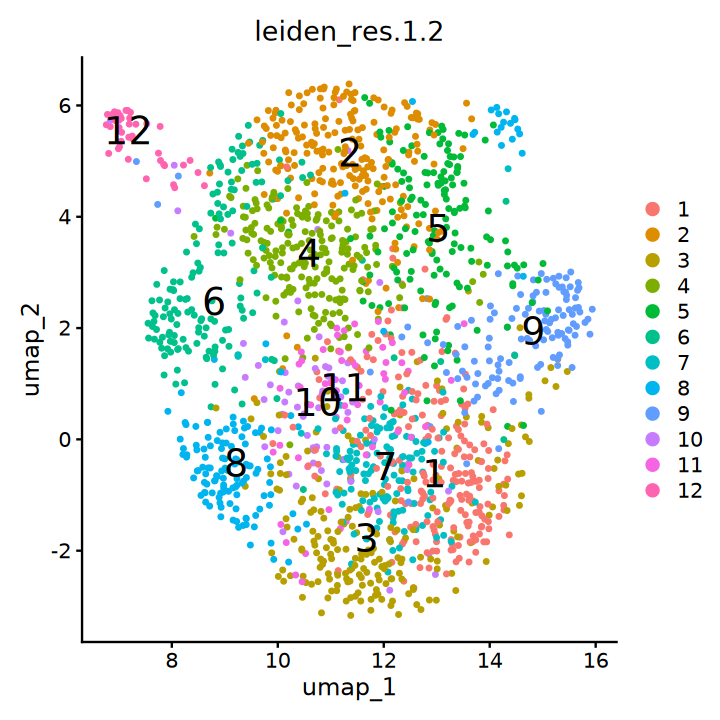

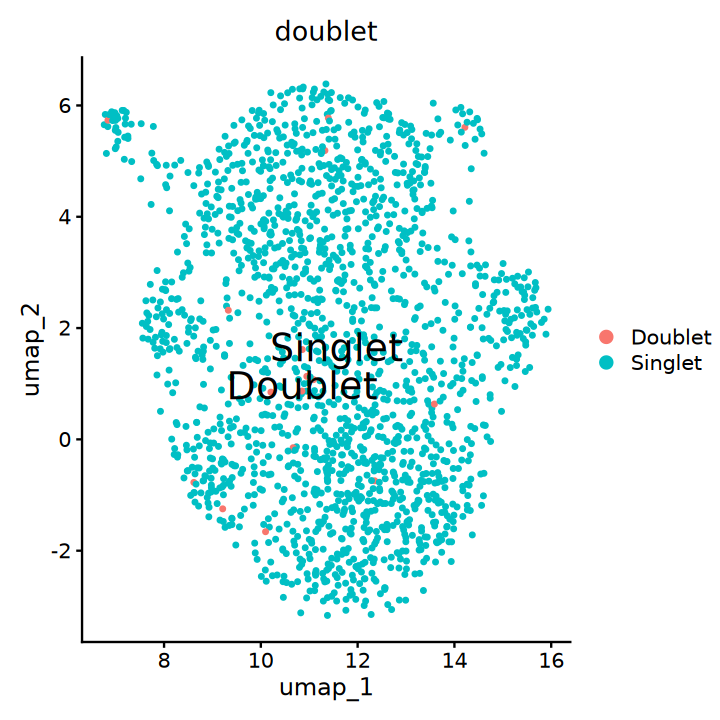

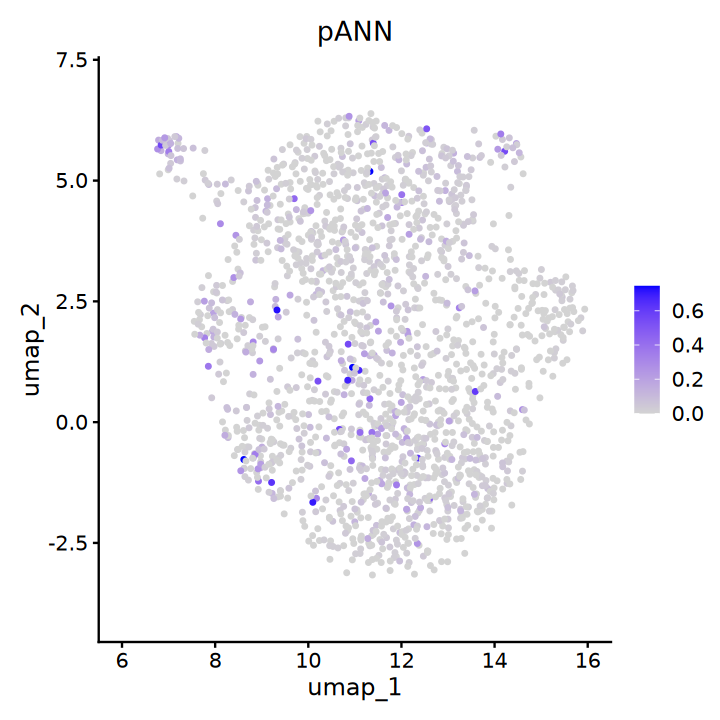

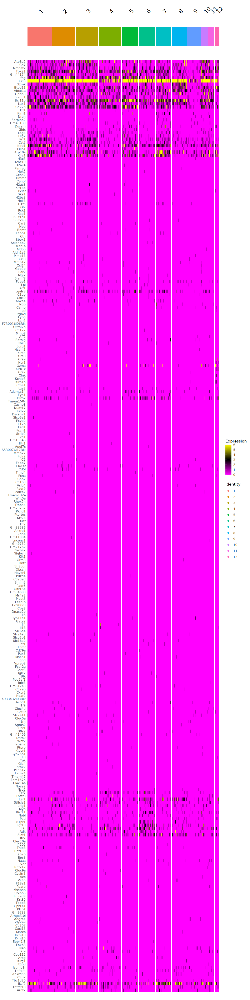

In [12]:
grp="leiden_res.1.2"

options(repr.plot.width=6, repr.plot.height=6)
DimPlot(seu, group.by=grp, label=T,label.size = 8)
DimPlot(seu, group.by="doublet", label=T,label.size = 8)
FeaturePlot(seu, features = "pANN")


# Top
markers.top  <- markers %>% group_by(cluster) %>% top_n(n = 15, wt = avg_log2FC)
options(repr.plot.width=10, repr.plot.height=40)
DoHeatmap(seu, features =markers.top$gene, slot="counts", group.by = grp )

In [13]:
barcodes<-colnames(subset(seu, doublet=="Doublet"))
putative_doublets<-unique(c(putative_doublets, barcodes))

#C2

In [14]:
seu <- seu_subsets[["2"]]

tic("Renormalization and Dimensionality reduction")
seu  <- NormalizeData(seu,  normalization.method="LogNormalize", scale.factor=10000, block.size=800)
seu  <- FindVariableFeatures(seu,  selection.method = "vst", nfeatures = 2000)

plan("multicore", workers = 54)
options(future.globals.maxSize = Inf)
seu <- ScaleData(seu,  features=rownames(seu), block.size = 500, min.cells.to.block = 1000)
plan("sequential")

seu <- RunPCA(seu,  npcs=30, features=VariableFeatures(object=seu),  verbose = FALSE)
seu <- RunUMAP(object=seu,  dims=1:30, verbose=FALSE, min.dist=0.5, n.neighbors = 30L, umap.method = "umap-learn", metric = "correlation")
toc()

seu <- FindNeighbors(seu, dims = 1:10, graph.name = 'leiden')
seu <- FindClusters(seu, resolution = c(0.1,0.3,0.5,0.7,0.9,1.2), algorithm=4, n.iter=100, group.singletons=T,graph.name = 'leiden')


seu -> seu_subsets[["2"]]

Normalizing layer: counts

Finding variable features for layer counts

Centering and scaling data matrix



Renormalization and Dimensionality reduction: 26.329 sec elapsed


Computing nearest neighbor graph

Computing SNN

Only one graph name supplied, storing nearest-neighbor graph only



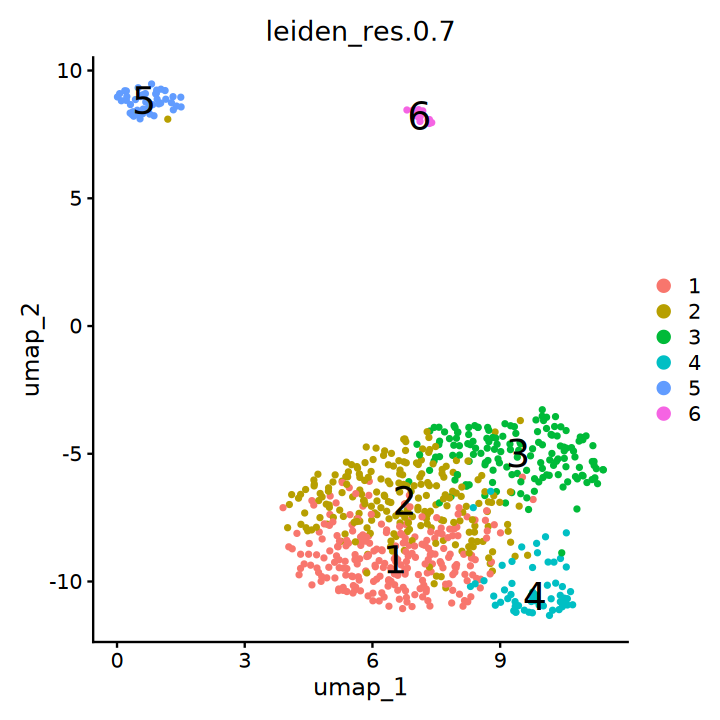

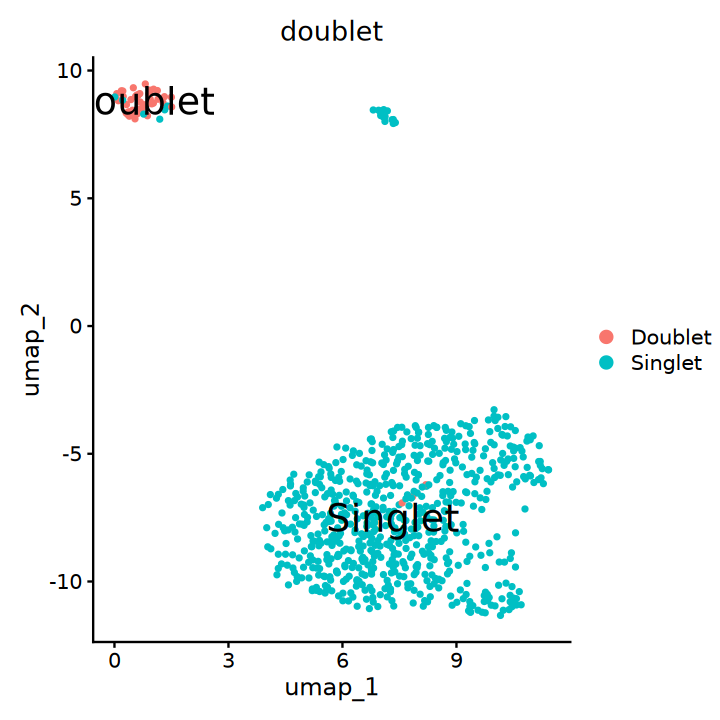

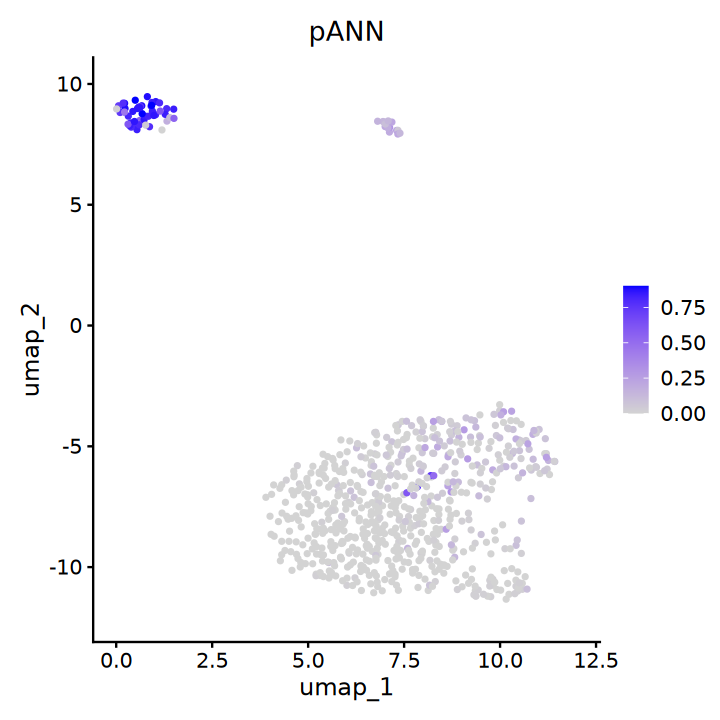

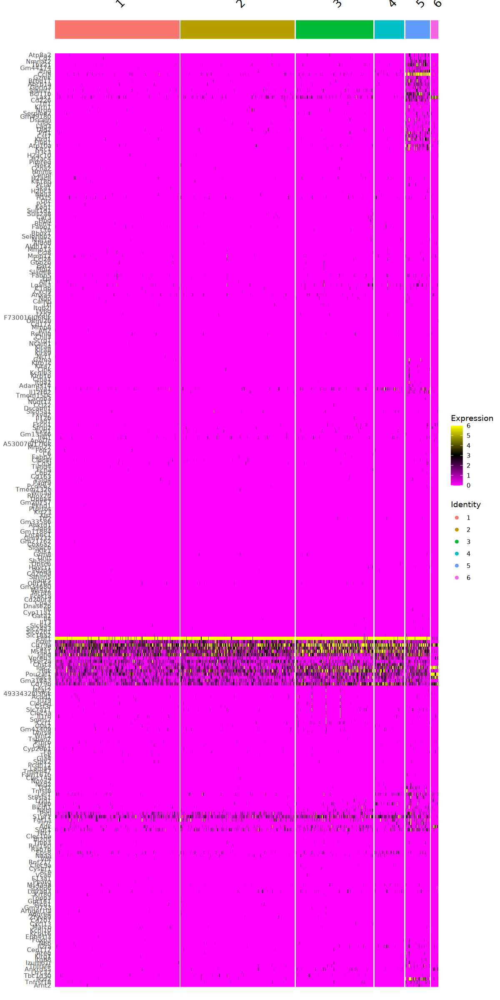

In [15]:
grp="leiden_res.0.7"

options(repr.plot.width=6, repr.plot.height=6)
DimPlot(seu, group.by=grp, label=T,label.size = 8)
DimPlot(seu, group.by="doublet", label=T,label.size = 8)
FeaturePlot(seu, features = "pANN")


# Top
markers.top  <- markers %>% group_by(cluster) %>% top_n(n = 15, wt = avg_log2FC)
options(repr.plot.width=10, repr.plot.height=20)
DoHeatmap(seu, features =markers.top$gene, slot="counts", group.by = grp )

In [16]:
barcodes<-colnames(subset(seu, leiden_res.0.7=="5"|doublet=="Doublet"))
putative_doublets<-unique(c(putative_doublets, barcodes))

# C1

In [17]:
seu <- seu_subsets[["1"]]

tic("Renormalization and Dimensionality reduction")
seu  <- NormalizeData(seu,  normalization.method="LogNormalize", scale.factor=10000, block.size=800)
seu  <- FindVariableFeatures(seu,  selection.method = "vst", nfeatures = 2000)

plan("multicore", workers = 54)
options(future.globals.maxSize = Inf)
seu <- ScaleData(seu,  features=rownames(seu), block.size = 500, min.cells.to.block = 1000)
plan("sequential")

seu <- RunPCA(seu,  npcs=30, features=VariableFeatures(object=seu),  verbose = FALSE)
seu <- RunUMAP(object=seu,  dims=1:30, verbose=FALSE, min.dist=0.5, n.neighbors = 30L, umap.method = "umap-learn", metric = "correlation")
toc()

seu <- FindNeighbors(seu, dims = 1:10, graph.name = 'leiden')
seu <- FindClusters(seu, resolution = c(0.1,0.3,0.5,0.7,0.9,1.2), algorithm=4, n.iter=100, group.singletons=T,graph.name = 'leiden')


seu -> seu_subsets[["1"]]

Normalizing layer: counts

Finding variable features for layer counts

Centering and scaling data matrix



Renormalization and Dimensionality reduction: 31.283 sec elapsed


Computing nearest neighbor graph

Computing SNN

Only one graph name supplied, storing nearest-neighbor graph only



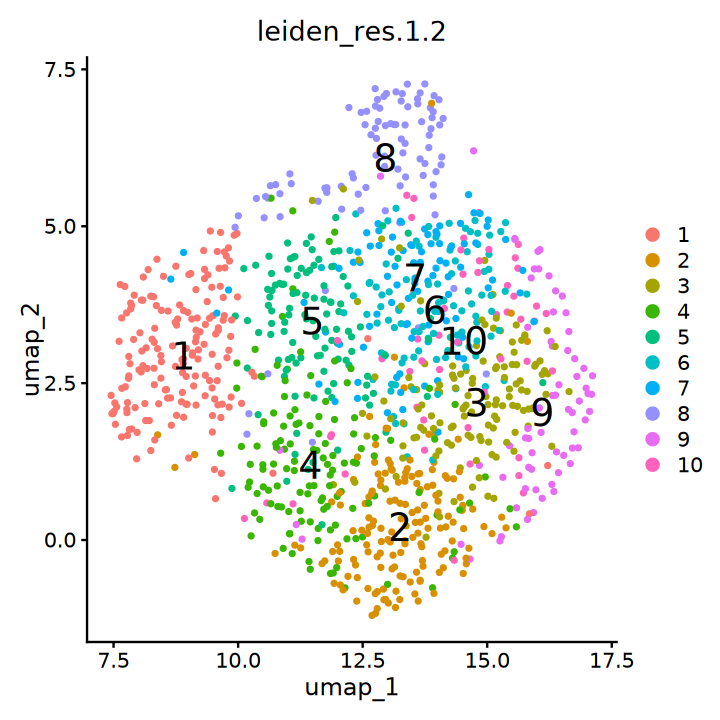

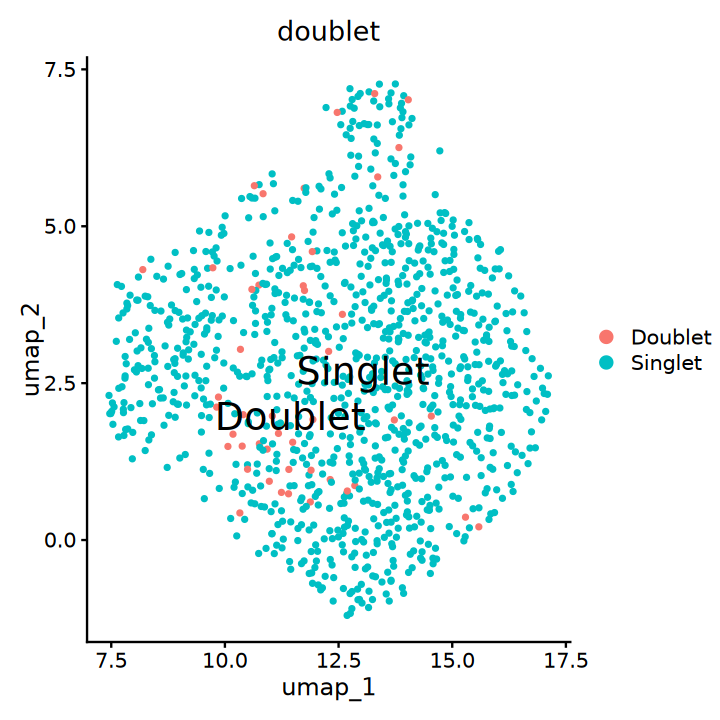

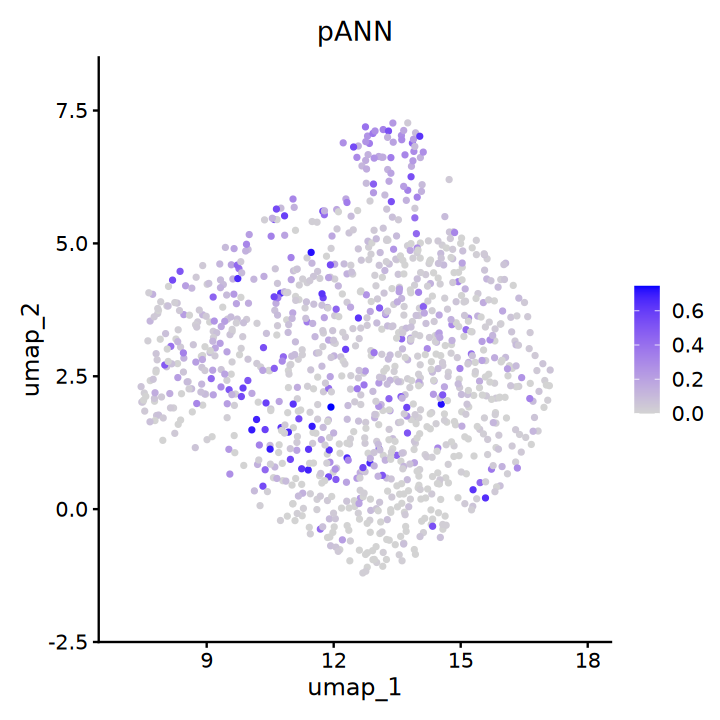

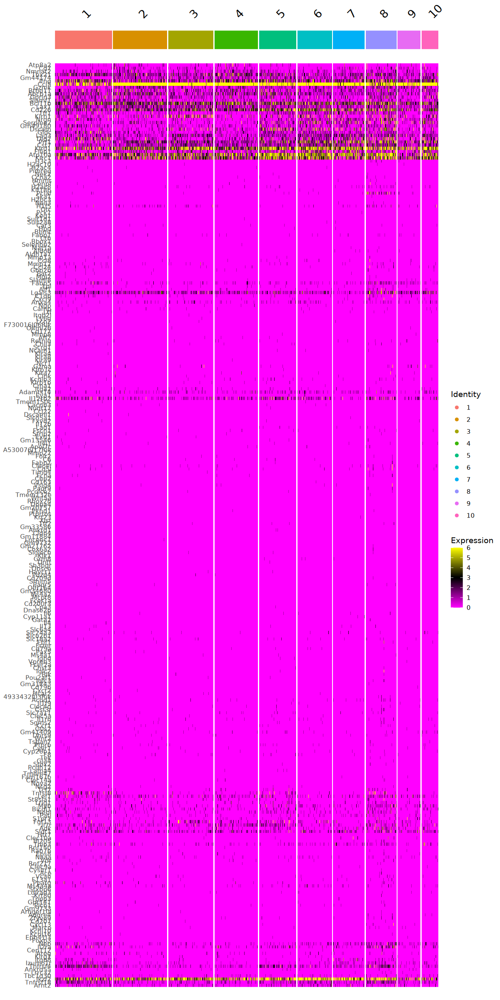

In [18]:
grp="leiden_res.1.2"

options(repr.plot.width=6, repr.plot.height=6)
DimPlot(seu, group.by=grp, label=T,label.size = 8)
DimPlot(seu, group.by="doublet", label=T,label.size = 8)
FeaturePlot(seu, features = "pANN")


# Top
markers.top  <- markers %>% group_by(cluster) %>% top_n(n = 15, wt = avg_log2FC)
options(repr.plot.width=10, repr.plot.height=20)
DoHeatmap(seu, features =markers.top$gene, slot="counts", group.by = grp )

In [19]:
barcodes<-colnames(subset(seu, doublet=="Doublet"))
putative_doublets<-unique(c(putative_doublets, barcodes))

# C3

In [20]:
seu <- seu_subsets[["3"]]

tic("Renormalization and Dimensionality reduction")
seu  <- NormalizeData(seu,  normalization.method="LogNormalize", scale.factor=10000, block.size=800)
seu  <- FindVariableFeatures(seu,  selection.method = "vst", nfeatures = 2000)

plan("multicore", workers = 54)
options(future.globals.maxSize = Inf)
seu <- ScaleData(seu,  features=rownames(seu), block.size = 500, min.cells.to.block = 1000)
plan("sequential")

seu <- RunPCA(seu,  npcs=30, features=VariableFeatures(object=seu),  verbose = FALSE)
seu <- RunUMAP(object=seu,  dims=1:30, verbose=FALSE, min.dist=0.5, n.neighbors = 30L, umap.method = "umap-learn", metric = "correlation")
toc()

seu <- FindNeighbors(seu, dims = 1:10, graph.name = 'leiden')
seu <- FindClusters(seu, resolution = c(0.1,0.3,0.5,0.7,0.9,1.2), algorithm=4, n.iter=100, group.singletons=T,graph.name = 'leiden')


seu -> seu_subsets[["3"]]

Normalizing layer: counts

Finding variable features for layer counts

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -2.5257”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 0.30103”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  1.7568e-16”
Centering and scaling data matrix



Renormalization and Dimensionality reduction: 26.925 sec elapsed


Computing nearest neighbor graph

Computing SNN

Only one graph name supplied, storing nearest-neighbor graph only



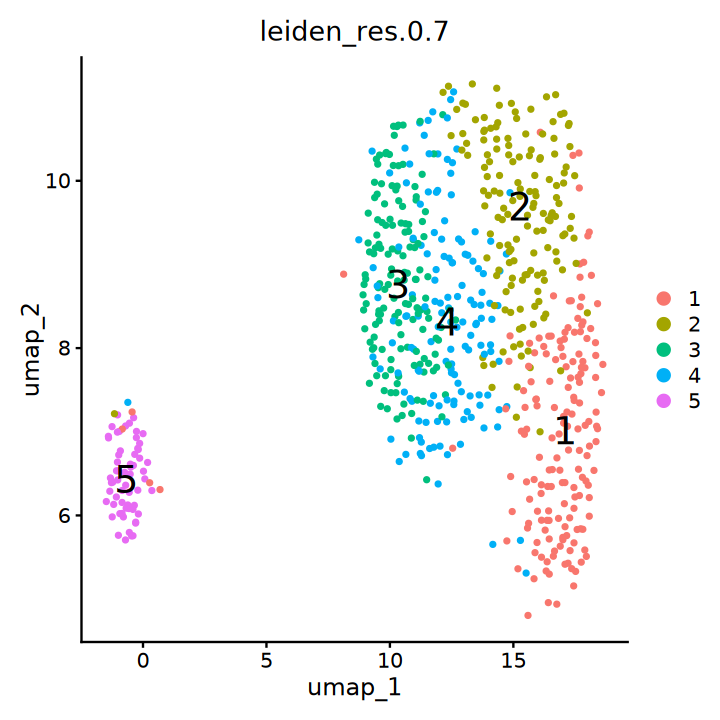

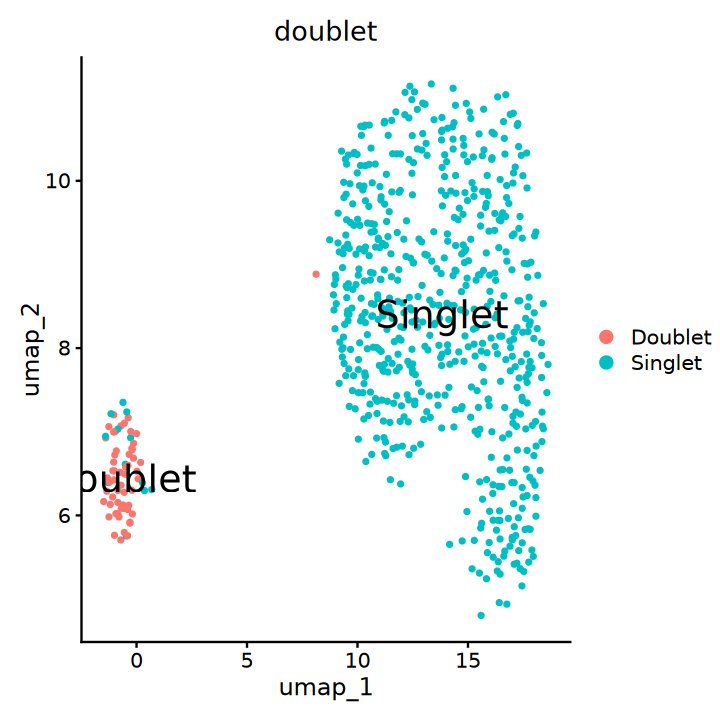

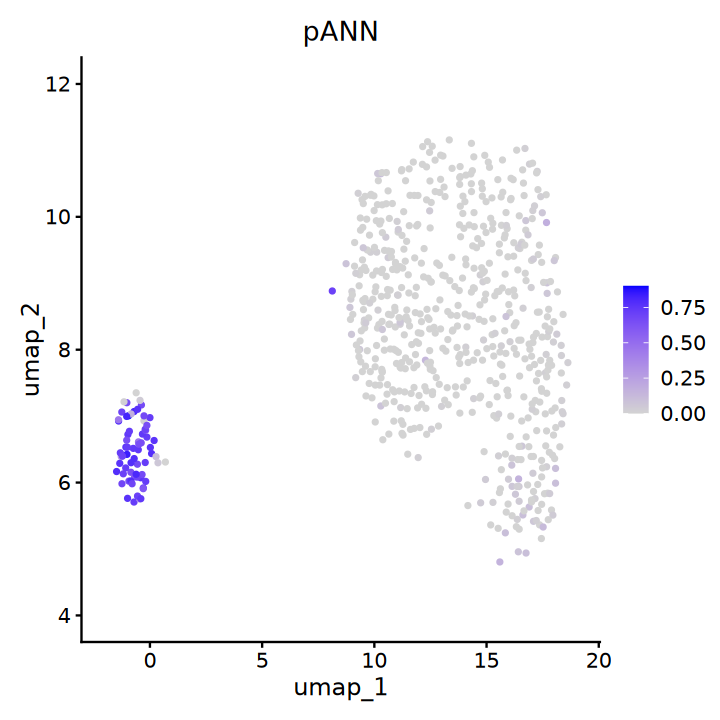

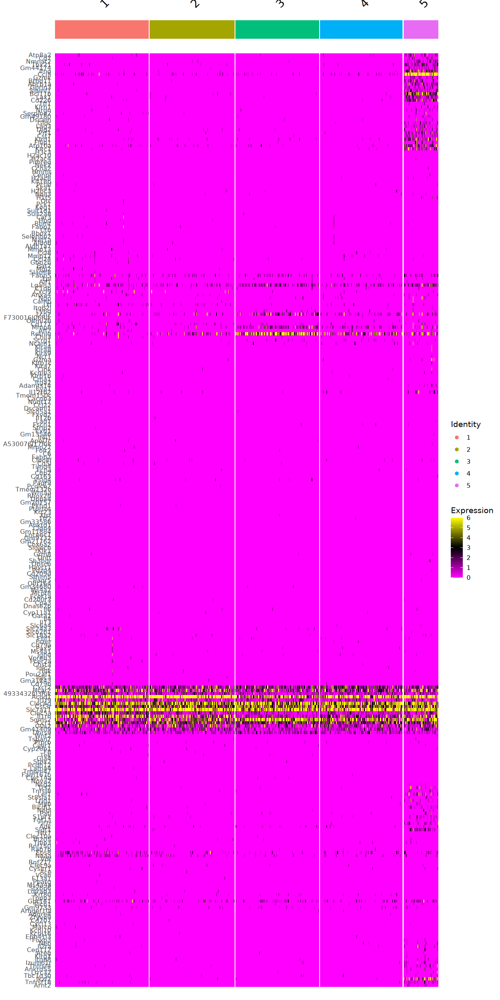

In [21]:
grp="leiden_res.0.7"

options(repr.plot.width=6, repr.plot.height=6)
DimPlot(seu, group.by=grp, label=T,label.size = 8)
DimPlot(seu, group.by="doublet", label=T,label.size = 8)
FeaturePlot(seu, features = "pANN")


# Top
markers.top  <- markers %>% group_by(cluster) %>% top_n(n = 15, wt = avg_log2FC)
options(repr.plot.width=10, repr.plot.height=20)
DoHeatmap(seu, features =markers.top$gene, slot="counts", group.by = grp )

In [22]:
barcodes<-colnames(subset(seu, leiden_res.0.7=="5"|doublet=="Doublet"))
putative_doublets<-unique(c(putative_doublets, barcodes))

# C6

In [23]:
seu <- seu_subsets[["6"]]

tic("Renormalization and Dimensionality reduction")
seu  <- NormalizeData(seu,  normalization.method="LogNormalize", scale.factor=10000, block.size=800)
seu  <- FindVariableFeatures(seu,  selection.method = "vst", nfeatures = 2000)

plan("multicore", workers = 54)
options(future.globals.maxSize = Inf)
seu <- ScaleData(seu,  features=rownames(seu), block.size = 500, min.cells.to.block = 1000)
plan("sequential")

seu <- RunPCA(seu,  npcs=30, features=VariableFeatures(object=seu),  verbose = FALSE)
seu <- RunUMAP(object=seu,  dims=1:30, verbose=FALSE, min.dist=0.5, n.neighbors = 30L, umap.method = "umap-learn", metric = "correlation")
toc()

seu <- FindNeighbors(seu, dims = 1:10, graph.name = 'leiden')
seu <- FindClusters(seu, resolution = c(0.1,0.3,0.5,0.7,0.9,1.2), algorithm=4, n.iter=100, group.singletons=T,graph.name = 'leiden')


seu -> seu_subsets[["6"]]

Normalizing layer: counts

Finding variable features for layer counts

Centering and scaling data matrix



Renormalization and Dimensionality reduction: 23.172 sec elapsed


Computing nearest neighbor graph

Computing SNN

Only one graph name supplied, storing nearest-neighbor graph only



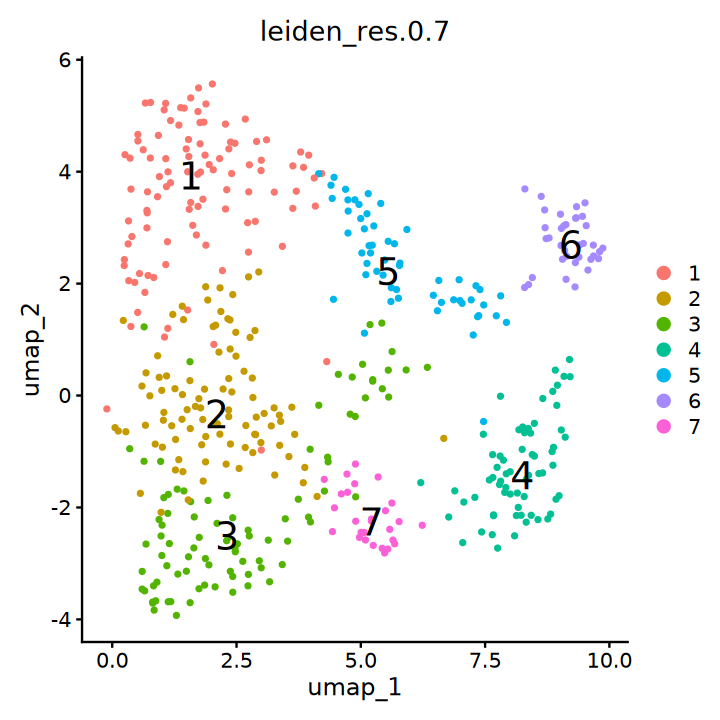

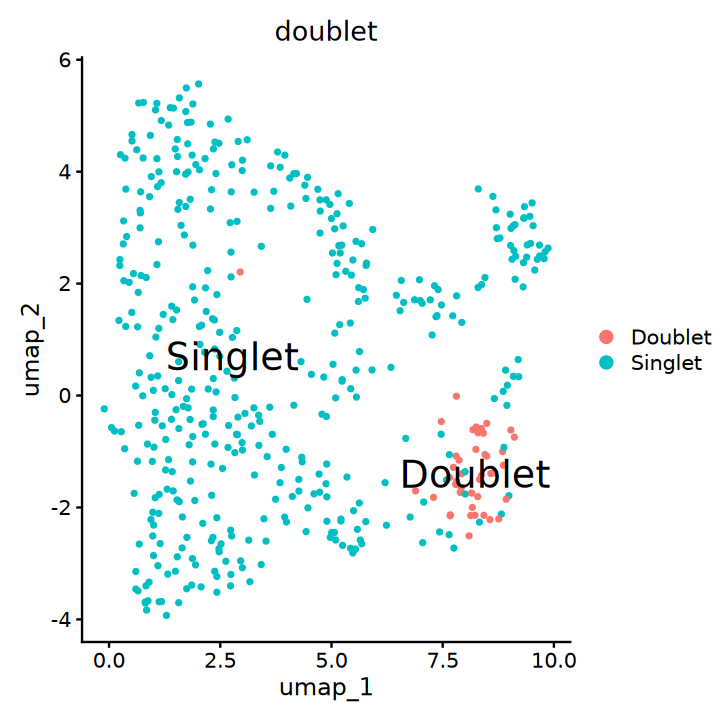

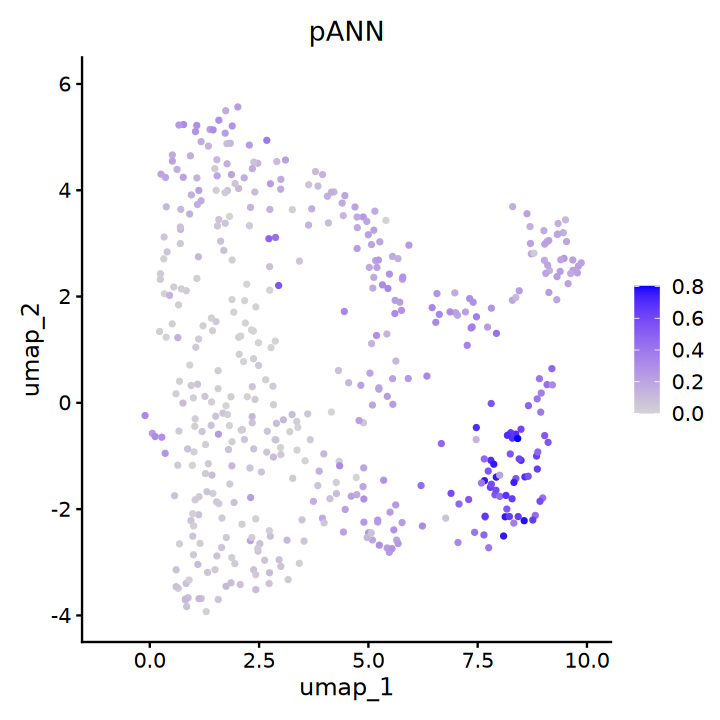

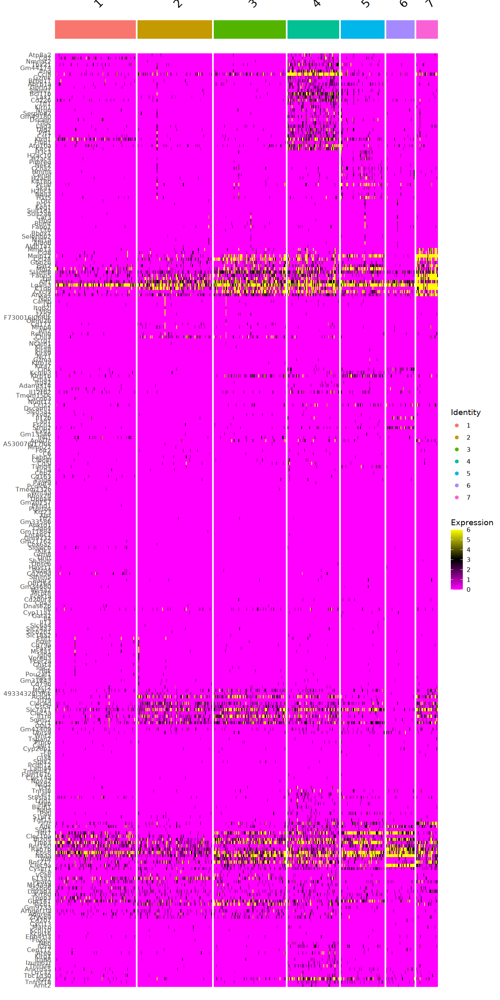

In [24]:
grp="leiden_res.0.7"

options(repr.plot.width=6, repr.plot.height=6)
DimPlot(seu, group.by=grp, label=T,label.size = 8)
DimPlot(seu, group.by="doublet", label=T,label.size = 8)
FeaturePlot(seu, features = "pANN")


# Top
markers.top  <- markers %>% group_by(cluster) %>% top_n(n = 15, wt = avg_log2FC)
options(repr.plot.width=10, repr.plot.height=20)
DoHeatmap(seu, features =markers.top$gene, slot="counts", group.by = grp )

In [25]:
barcodes<-colnames(subset(seu, leiden_res.0.7=="4"|doublet=="Doublet"))
putative_doublets<-unique(c(putative_doublets, barcodes))

# C7

In [26]:
seu <- seu_subsets[["7"]]

tic("Renormalization and Dimensionality reduction")
seu  <- NormalizeData(seu,  normalization.method="LogNormalize", scale.factor=10000, block.size=800)
seu  <- FindVariableFeatures(seu,  selection.method = "vst", nfeatures = 2000)

plan("multicore", workers = 54)
options(future.globals.maxSize = Inf)
seu <- ScaleData(seu,  features=rownames(seu), block.size = 500, min.cells.to.block = 1000)
plan("sequential")

seu <- RunPCA(seu,  npcs=30, features=VariableFeatures(object=seu),  verbose = FALSE)
seu <- RunUMAP(object=seu,  dims=1:30, verbose=FALSE, min.dist=0.5, n.neighbors = 30L, umap.method = "umap-learn", metric = "correlation")
toc()

seu <- FindNeighbors(seu, dims = 1:10, graph.name = 'leiden')
seu <- FindClusters(seu, resolution = c(0.1,0.3,0.5,0.7,0.9,1.2), algorithm=4, n.iter=100, group.singletons=T,graph.name = 'leiden')


seu -> seu_subsets[["7"]]

Normalizing layer: counts

Finding variable features for layer counts

Centering and scaling data matrix



Renormalization and Dimensionality reduction: 17.381 sec elapsed


Computing nearest neighbor graph

Computing SNN

Only one graph name supplied, storing nearest-neighbor graph only



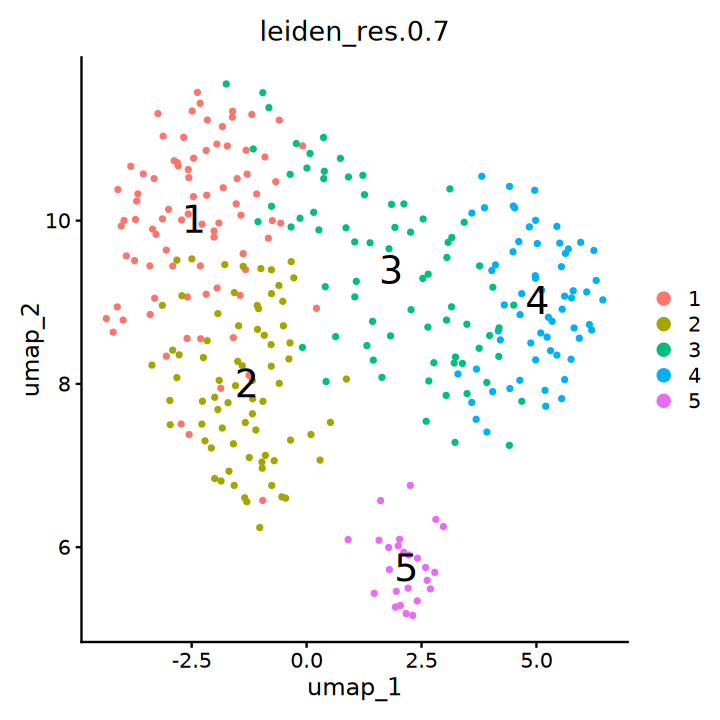

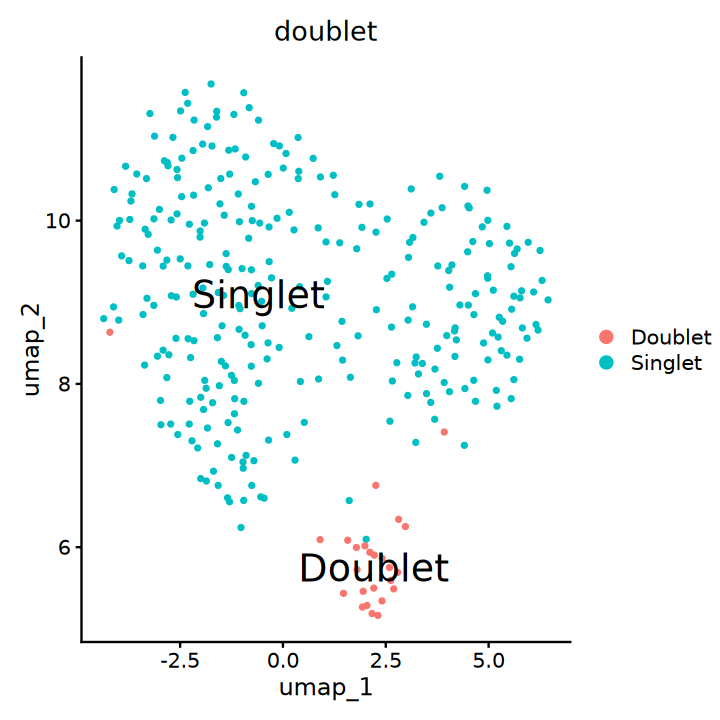

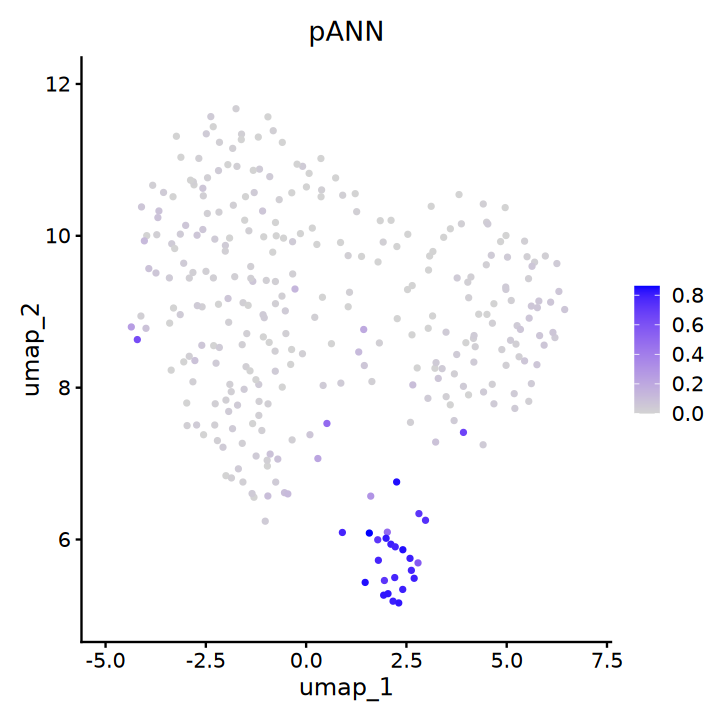

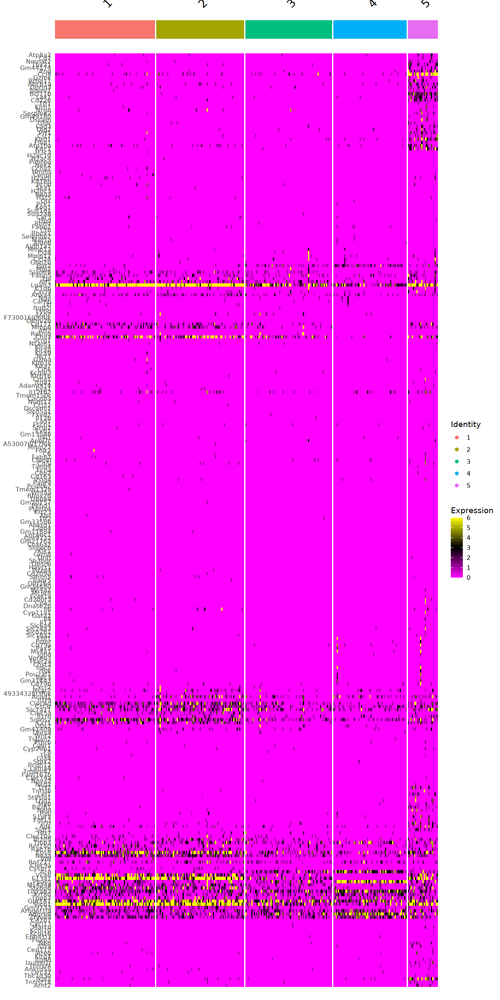

In [27]:
grp="leiden_res.0.7"

options(repr.plot.width=6, repr.plot.height=6)
DimPlot(seu, group.by=grp, label=T,label.size = 8)
DimPlot(seu, group.by="doublet", label=T,label.size = 8)
FeaturePlot(seu, features = "pANN")


# Top
markers.top  <- markers %>% group_by(cluster) %>% top_n(n = 15, wt = avg_log2FC)
options(repr.plot.width=10, repr.plot.height=20)
DoHeatmap(seu, features =markers.top$gene, slot="counts", group.by = grp )

In [28]:
barcodes<-colnames(subset(seu, leiden_res.0.7=="5"|doublet=="Doublet"))
putative_doublets<-unique(c(putative_doublets, barcodes))

# C8

In [29]:
seu <- seu_subsets[["8"]]

tic("Renormalization and Dimensionality reduction")
seu  <- NormalizeData(seu,  normalization.method="LogNormalize", scale.factor=10000, block.size=800)
seu  <- FindVariableFeatures(seu,  selection.method = "vst", nfeatures = 2000)

plan("multicore", workers = 54)
options(future.globals.maxSize = Inf)
seu <- ScaleData(seu,  features=rownames(seu), block.size = 500, min.cells.to.block = 1000)
plan("sequential")

seu <- RunPCA(seu,  npcs=30, features=VariableFeatures(object=seu),  verbose = FALSE)
seu <- RunUMAP(object=seu,  dims=1:30, verbose=FALSE, min.dist=0.5, n.neighbors = 30L, umap.method = "umap-learn", metric = "correlation")
toc()

seu <- FindNeighbors(seu, dims = 1:10, graph.name = 'leiden')
seu <- FindClusters(seu, resolution = c(0.1,0.3,0.5,0.7,0.9,1.2), algorithm=4, n.iter=100, group.singletons=T,graph.name = 'leiden')


seu -> seu_subsets[["8"]]

Normalizing layer: counts

Finding variable features for layer counts

Centering and scaling data matrix



Renormalization and Dimensionality reduction: 16.722 sec elapsed


Computing nearest neighbor graph

Computing SNN

Only one graph name supplied, storing nearest-neighbor graph only



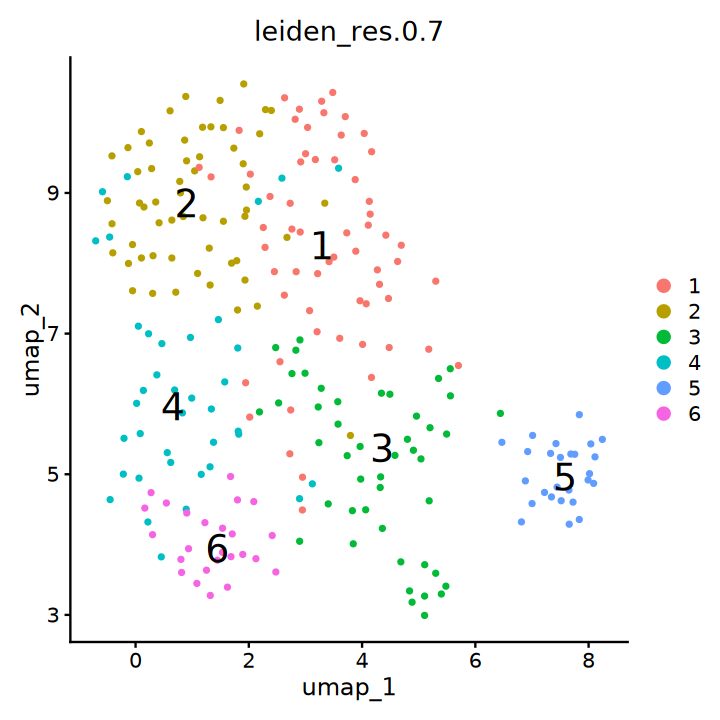

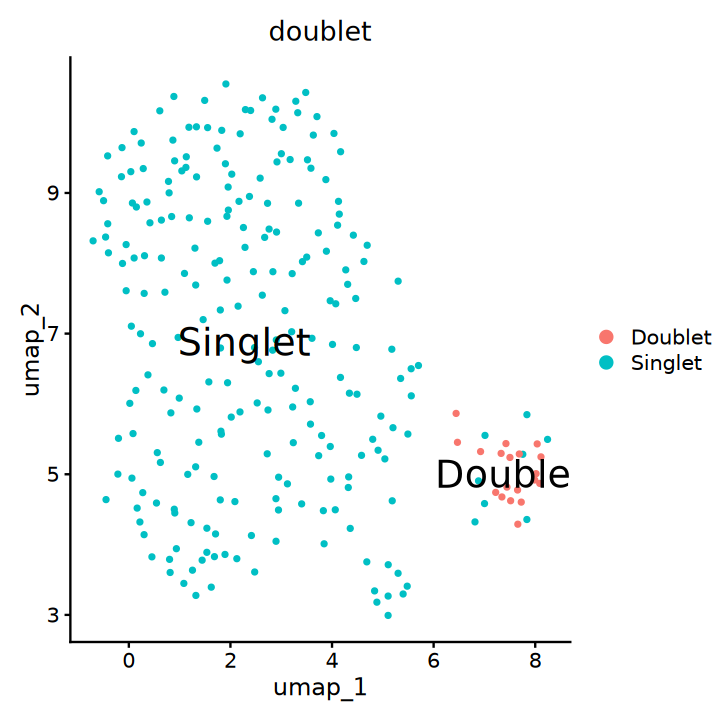

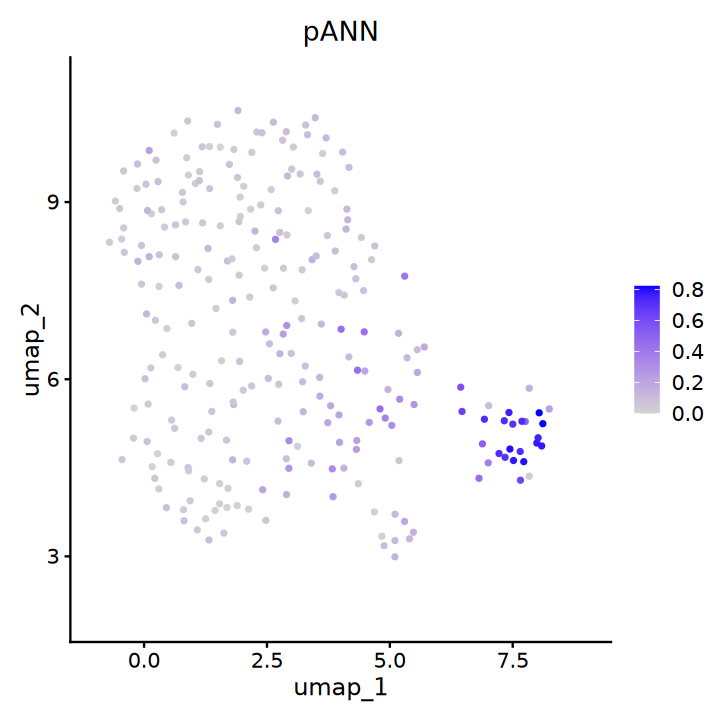

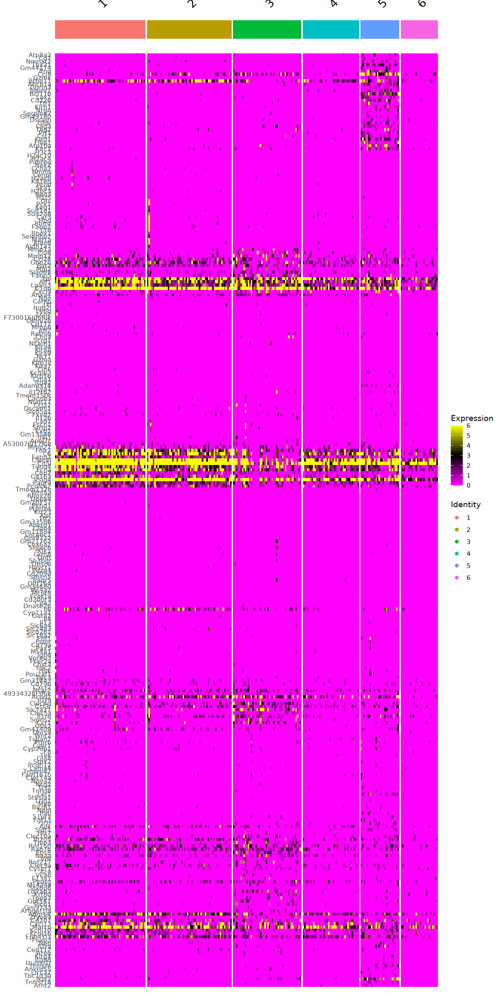

In [30]:
grp="leiden_res.0.7"

options(repr.plot.width=6, repr.plot.height=6)
DimPlot(seu, group.by=grp, label=T,label.size = 8)
DimPlot(seu, group.by="doublet", label=T,label.size = 8)
FeaturePlot(seu, features = "pANN")


# Top
markers.top  <- markers %>% group_by(cluster) %>% top_n(n = 15, wt = avg_log2FC)
options(repr.plot.width=10, repr.plot.height=20)
DoHeatmap(seu, features =markers.top$gene, slot="counts", group.by = grp )

In [31]:
barcodes<-colnames(subset(seu, leiden_res.0.7=="5"|doublet=="Doublet"))
putative_doublets<-unique(c(putative_doublets, barcodes))

# C9

In [32]:
seu <- seu_subsets[["9"]]

tic("Renormalization and Dimensionality reduction")
seu  <- NormalizeData(seu,  normalization.method="LogNormalize", scale.factor=10000, block.size=800)
seu  <- FindVariableFeatures(seu,  selection.method = "vst", nfeatures = 2000)

plan("multicore", workers = 54)
options(future.globals.maxSize = Inf)
seu <- ScaleData(seu,  features=rownames(seu), block.size = 500, min.cells.to.block = 1000)
plan("sequential")

seu <- RunPCA(seu,  npcs=30, features=VariableFeatures(object=seu),  verbose = FALSE)
seu <- RunUMAP(object=seu,  dims=1:30, verbose=FALSE, min.dist=0.5, n.neighbors = 30L, umap.method = "umap-learn", metric = "correlation")
toc()

seu <- FindNeighbors(seu, dims = 1:10, graph.name = 'leiden')
seu <- FindClusters(seu, resolution = c(0.1,0.3,0.5,0.7,0.9,1.2), algorithm=4, n.iter=100, group.singletons=T,graph.name = 'leiden')


seu -> seu_subsets[["9"]]

Normalizing layer: counts

Finding variable features for layer counts

Centering and scaling data matrix



Renormalization and Dimensionality reduction: 16.583 sec elapsed


Computing nearest neighbor graph

Computing SNN

Only one graph name supplied, storing nearest-neighbor graph only



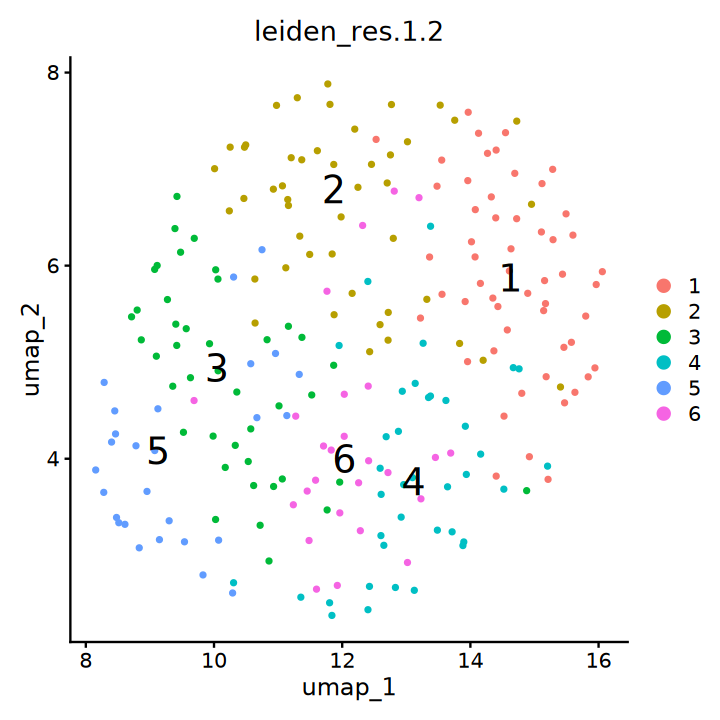

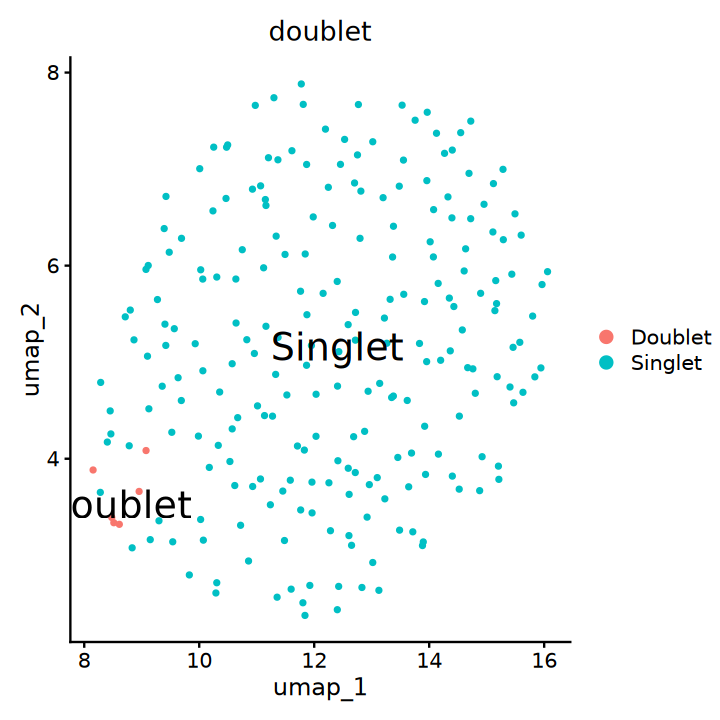

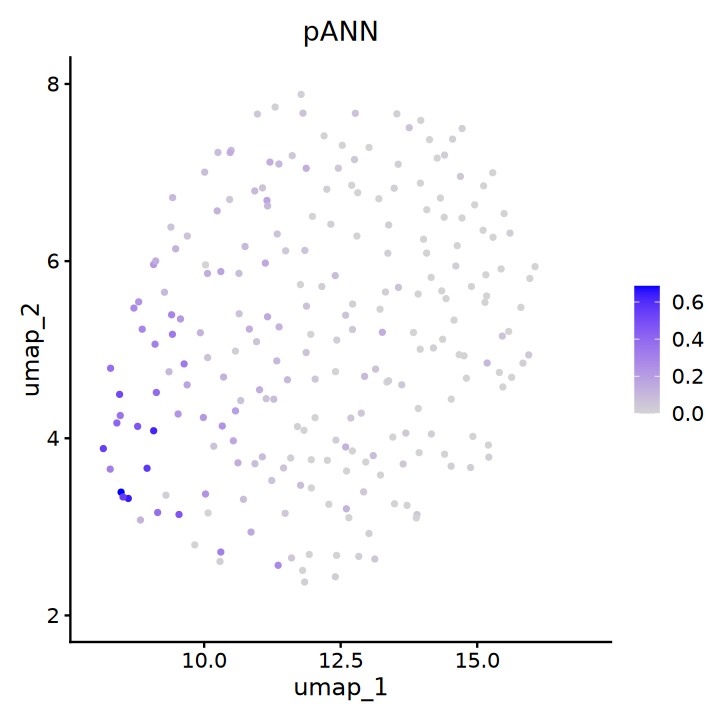

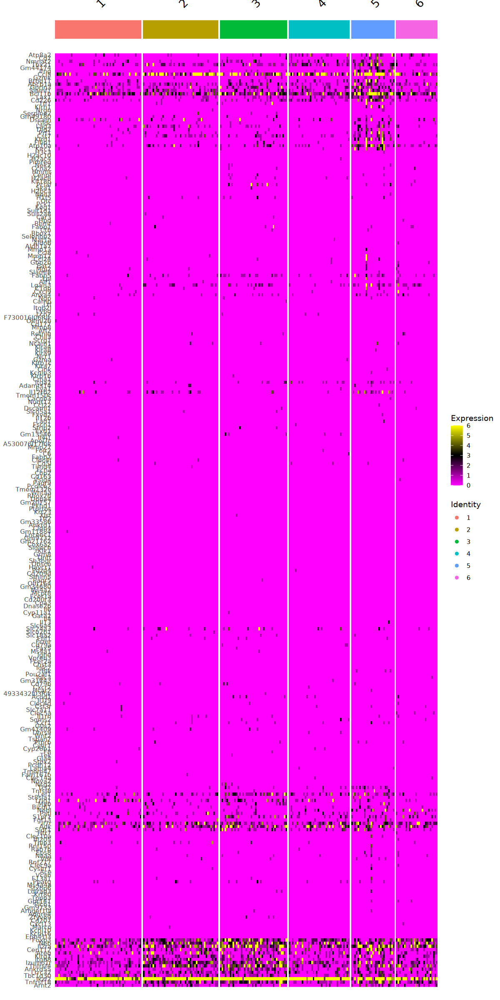

In [33]:
grp="leiden_res.1.2"

options(repr.plot.width=6, repr.plot.height=6)
DimPlot(seu, group.by=grp, label=T,label.size = 8)
DimPlot(seu, group.by="doublet", label=T,label.size = 8)
FeaturePlot(seu, features = "pANN")


# Top
markers.top  <- markers %>% group_by(cluster) %>% top_n(n = 15, wt = avg_log2FC)
options(repr.plot.width=10, repr.plot.height=20)
DoHeatmap(seu, features =markers.top$gene, slot="counts", group.by = grp )

In [34]:
barcodes<-colnames(subset(seu, leiden_res.1.2=="5"|doublet=="Doublet"))
putative_doublets<-unique(c(putative_doublets, barcodes))

# C4

In [35]:
seu <- seu_subsets[["4"]]

tic("Renormalization and Dimensionality reduction")
seu  <- NormalizeData(seu,  normalization.method="LogNormalize", scale.factor=10000, block.size=800)
seu  <- FindVariableFeatures(seu,  selection.method = "vst", nfeatures = 2000)

plan("multicore", workers = 54)
options(future.globals.maxSize = Inf)
seu <- ScaleData(seu,  features=rownames(seu), block.size = 500, min.cells.to.block = 1000)
plan("sequential")

seu <- RunPCA(seu,  npcs=30, features=VariableFeatures(object=seu),  verbose = FALSE)
seu <- RunUMAP(object=seu,  dims=1:30, verbose=FALSE, min.dist=0.5, n.neighbors = 30L, umap.method = "umap-learn", metric = "correlation")
toc()

seu <- FindNeighbors(seu, dims = 1:10, graph.name = 'leiden')
seu <- FindClusters(seu, resolution = c(0.1,0.3,0.5,0.7,0.9,1.2), algorithm=4, n.iter=100, group.singletons=T,graph.name = 'leiden')


seu -> seu_subsets[["4"]]

Normalizing layer: counts

Finding variable features for layer counts

Centering and scaling data matrix



Renormalization and Dimensionality reduction: 24.145 sec elapsed


Computing nearest neighbor graph

Computing SNN

Only one graph name supplied, storing nearest-neighbor graph only



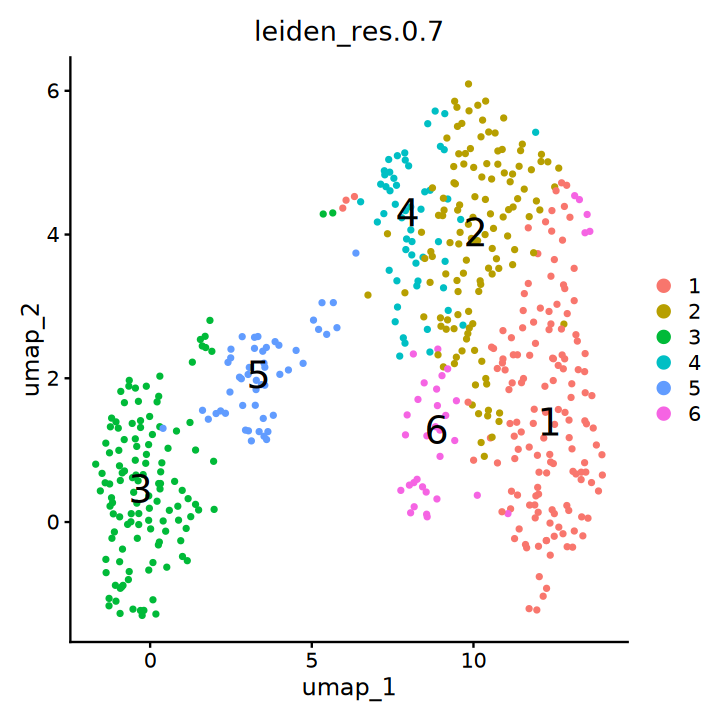

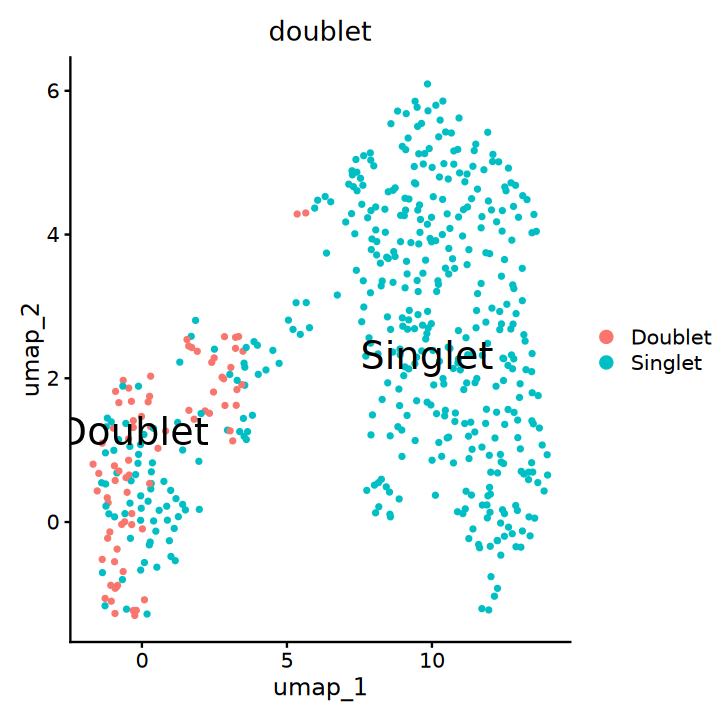

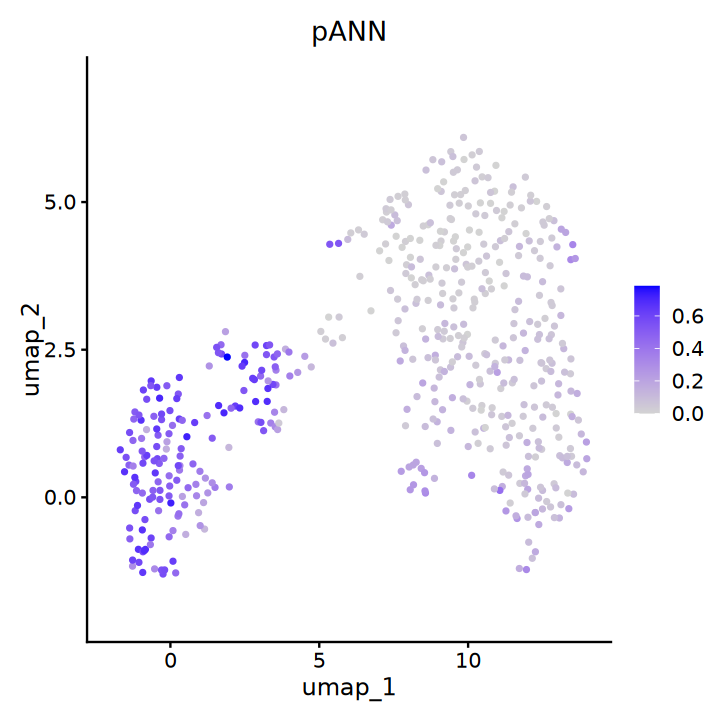

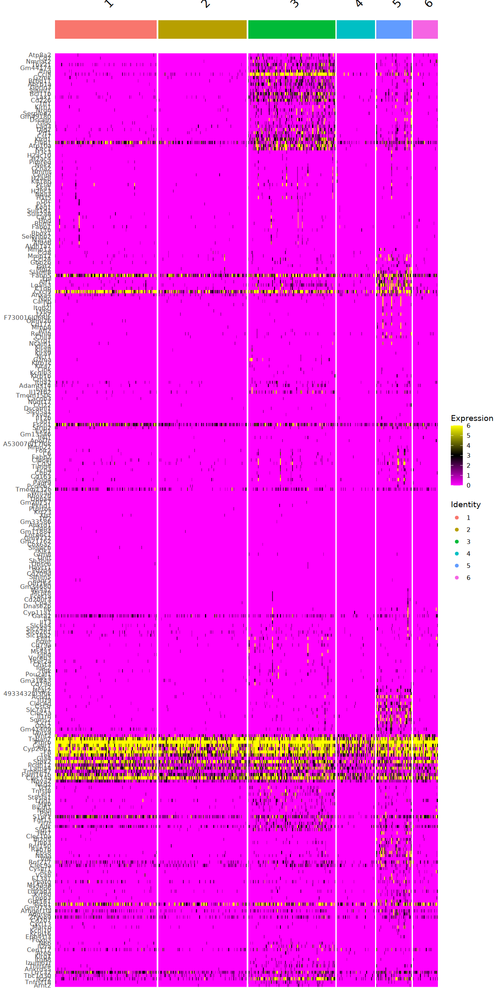

In [36]:
grp="leiden_res.0.7"

options(repr.plot.width=6, repr.plot.height=6)
DimPlot(seu, group.by=grp, label=T,label.size = 8)
DimPlot(seu, group.by="doublet", label=T,label.size = 8)
FeaturePlot(seu, features = "pANN")


# Top
markers.top  <- markers %>% group_by(cluster) %>% top_n(n = 15, wt = avg_log2FC)
options(repr.plot.width=10, repr.plot.height=20)
DoHeatmap(seu, features =markers.top$gene, slot="counts", group.by = grp )

In [37]:
barcodes<-colnames(subset(seu, leiden_res.0.7=="3"|leiden_res.0.7=="5"|doublet=="Doublet"))
putative_doublets<-unique(c(putative_doublets, barcodes))

# C16

In [38]:
seu <- seu_subsets[["16"]]

tic("Renormalization and Dimensionality reduction")
seu  <- NormalizeData(seu,  normalization.method="LogNormalize", scale.factor=10000, block.size=800)
seu  <- FindVariableFeatures(seu,  selection.method = "vst", nfeatures = 2000)

plan("multicore", workers = 54)
options(future.globals.maxSize = Inf)
seu <- ScaleData(seu,  features=rownames(seu), block.size = 500, min.cells.to.block = 1000)
plan("sequential")

seu <- RunPCA(seu,  npcs=30, features=VariableFeatures(object=seu),  verbose = FALSE)
seu <- RunUMAP(object=seu,  dims=1:30, verbose=FALSE, min.dist=0.5, n.neighbors = 30L, umap.method = "umap-learn", metric = "correlation")
toc()

seu <- FindNeighbors(seu, dims = 1:10, graph.name = 'leiden')
seu <- FindClusters(seu, resolution = c(0.1,0.3,0.5,0.7,0.9,1.2), algorithm=4, n.iter=100, group.singletons=T,graph.name = 'leiden')


seu -> seu_subsets[["16"]]

Normalizing layer: counts

Finding variable features for layer counts

Centering and scaling data matrix



Renormalization and Dimensionality reduction: 15.636 sec elapsed


Computing nearest neighbor graph

Computing SNN

Only one graph name supplied, storing nearest-neighbor graph only

1 singletons identified. 4 final clusters.



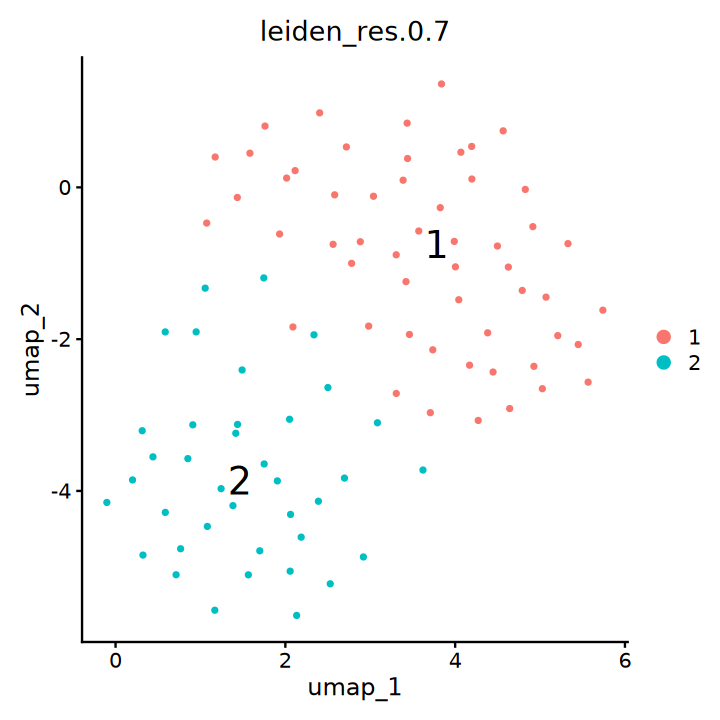

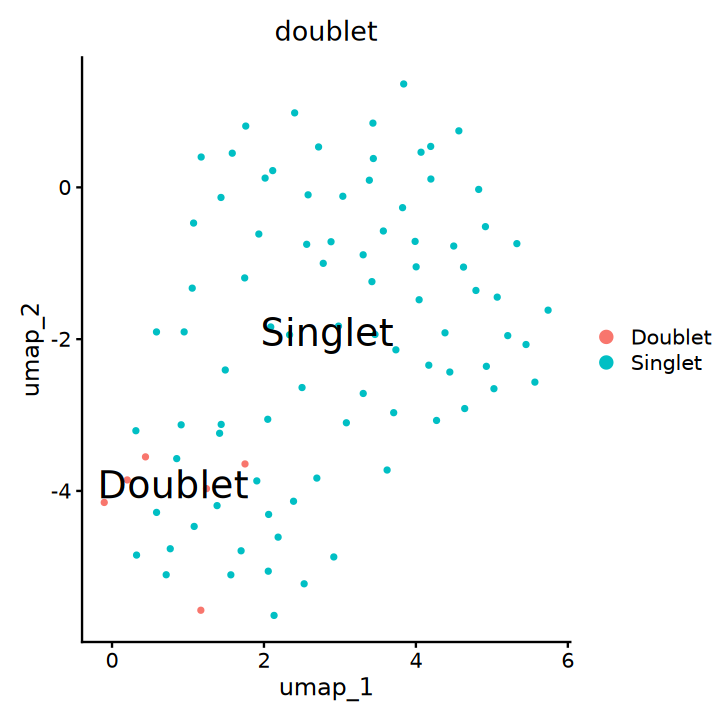

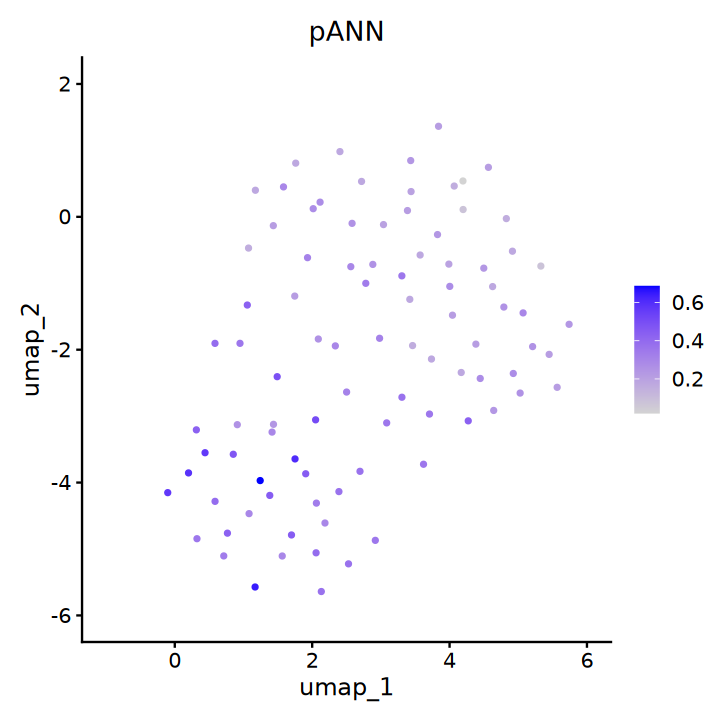

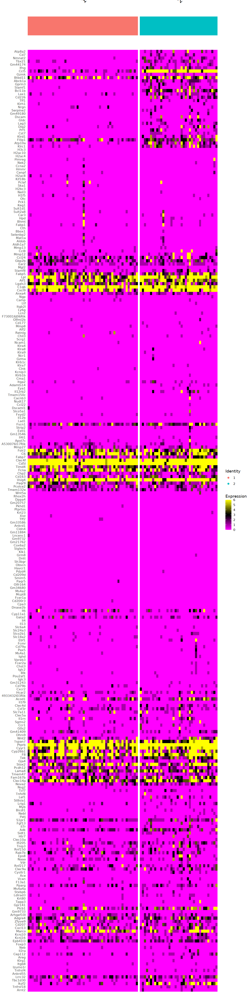

In [39]:
grp="leiden_res.0.7"

options(repr.plot.width=6, repr.plot.height=6)
DimPlot(seu, group.by=grp, label=T,label.size = 8)
DimPlot(seu, group.by="doublet", label=T,label.size = 8)
FeaturePlot(seu, features = "pANN")


# Top
markers.top  <- markers %>% group_by(cluster) %>% top_n(n = 15, wt = avg_log2FC)
options(repr.plot.width=10, repr.plot.height=40)
DoHeatmap(seu, features =markers.top$gene, slot="counts", group.by = grp )

In [40]:
barcodes<-colnames(seu)
putative_doublets<-unique(c(putative_doublets, barcodes))

#C17

In [41]:
seu <- seu_subsets[["17"]]

tic("Renormalization and Dimensionality reduction")
seu  <- NormalizeData(seu,  normalization.method="LogNormalize", scale.factor=10000, block.size=800)
seu  <- FindVariableFeatures(seu,  selection.method = "vst", nfeatures = 2000)

plan("multicore", workers = 54)
options(future.globals.maxSize = Inf)
seu <- ScaleData(seu,  features=rownames(seu), block.size = 500, min.cells.to.block = 1000)
plan("sequential")

seu <- RunPCA(seu,  npcs=30, features=VariableFeatures(object=seu),  verbose = FALSE)
seu <- RunUMAP(object=seu,  dims=1:30, verbose=FALSE, min.dist=0.5, n.neighbors = 30L, umap.method = "umap-learn", metric = "correlation")
toc()

seu <- FindNeighbors(seu, dims = 1:10, graph.name = 'leiden')
seu <- FindClusters(seu, resolution = c(0.1,0.3,0.5,0.7,0.9,1.2), algorithm=4, n.iter=100, group.singletons=T,graph.name = 'leiden')


seu -> seu_subsets[["17"]]

Normalizing layer: counts

Finding variable features for layer counts

Centering and scaling data matrix



Renormalization and Dimensionality reduction: 15.647 sec elapsed


Computing nearest neighbor graph

Computing SNN

Only one graph name supplied, storing nearest-neighbor graph only



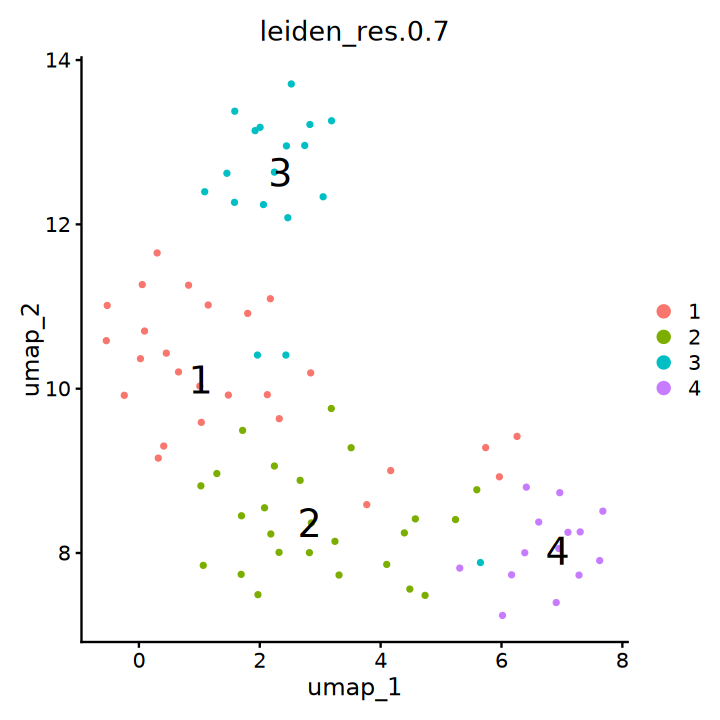

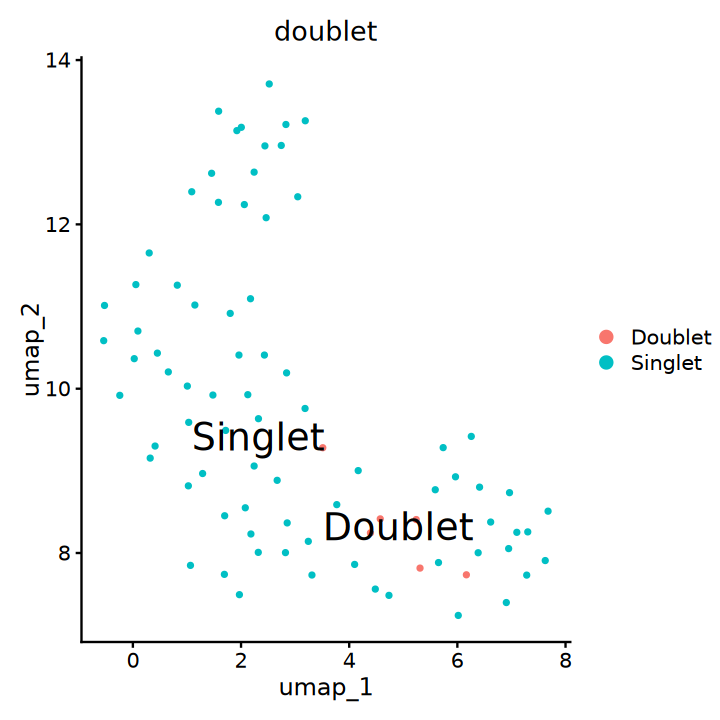

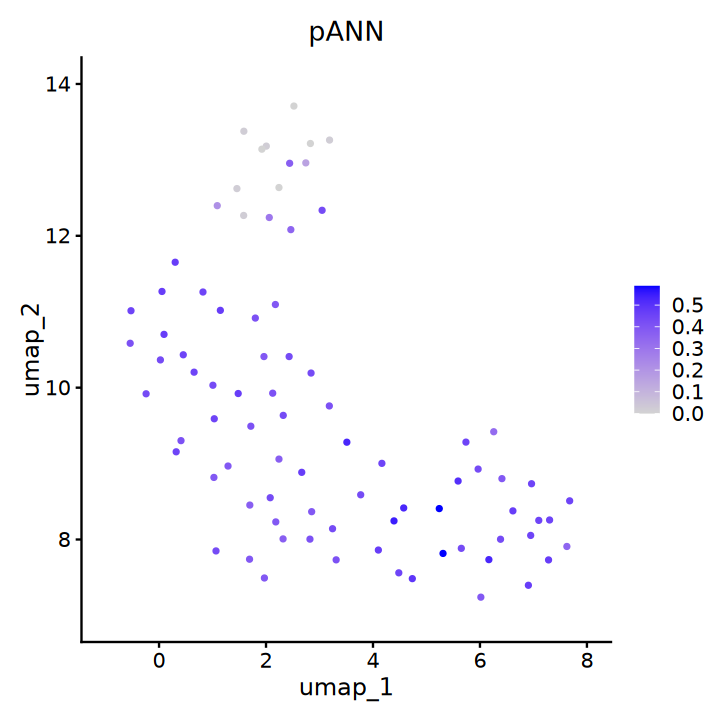

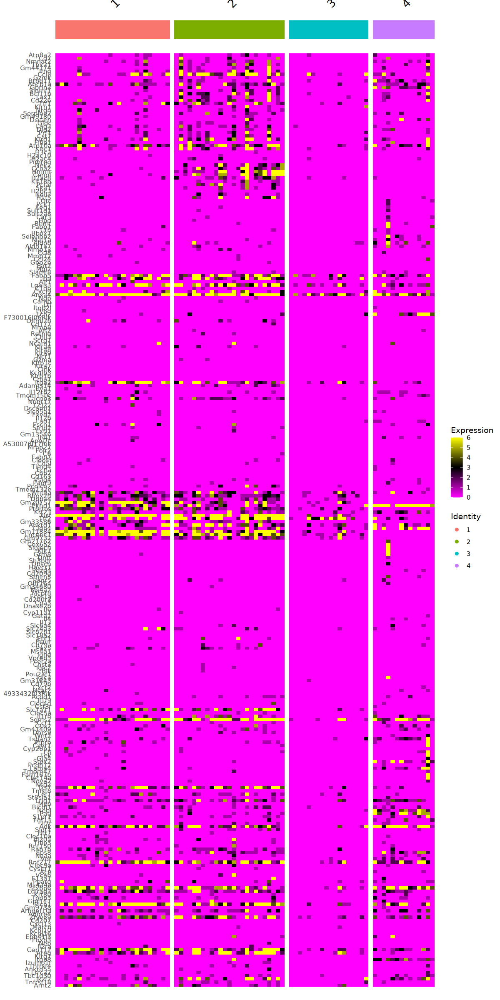

In [42]:
grp="leiden_res.0.7"

options(repr.plot.width=6, repr.plot.height=6)
DimPlot(seu, group.by=grp, label=T,label.size = 8)
DimPlot(seu, group.by="doublet", label=T,label.size = 8)
FeaturePlot(seu, features = "pANN")


# Top
markers.top  <- markers %>% group_by(cluster) %>% top_n(n = 15, wt = avg_log2FC)
options(repr.plot.width=10, repr.plot.height=20)
DoHeatmap(seu, features =markers.top$gene, slot="counts", group.by = grp )

In [43]:
barcodes<-colnames(seu)
putative_doublets<-unique(c(putative_doublets, barcodes))

#C18

In [44]:
seu <- seu_subsets[["18"]]

tic("Renormalization and Dimensionality reduction")
seu  <- NormalizeData(seu,  normalization.method="LogNormalize", scale.factor=10000, block.size=800)
seu  <- FindVariableFeatures(seu,  selection.method = "vst", nfeatures = 2000)

plan("multicore", workers = 54)
options(future.globals.maxSize = Inf)
seu <- ScaleData(seu,  features=rownames(seu), block.size = 500, min.cells.to.block = 1000)
plan("sequential")

seu <- RunPCA(seu,  npcs=30, features=VariableFeatures(object=seu),  verbose = FALSE)
seu <- RunUMAP(object=seu,  dims=1:30, verbose=FALSE, min.dist=0.5, n.neighbors = 30L, umap.method = "umap-learn", metric = "correlation")
toc()

seu <- FindNeighbors(seu, dims = 1:10, graph.name = 'leiden')
seu <- FindClusters(seu, resolution = c(0.1,0.3,0.5,0.7,0.9,1.2), algorithm=4, n.iter=100, group.singletons=T,graph.name = 'leiden')


seu -> seu_subsets[["18"]]

Normalizing layer: counts

Finding variable features for layer counts

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -1.5051”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 0.30103”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  2.9906e-16”
Centering and scaling data matrix



Renormalization and Dimensionality reduction: 15.373 sec elapsed


Computing nearest neighbor graph

Computing SNN

Only one graph name supplied, storing nearest-neighbor graph only

1 singletons identified. 6 final clusters.



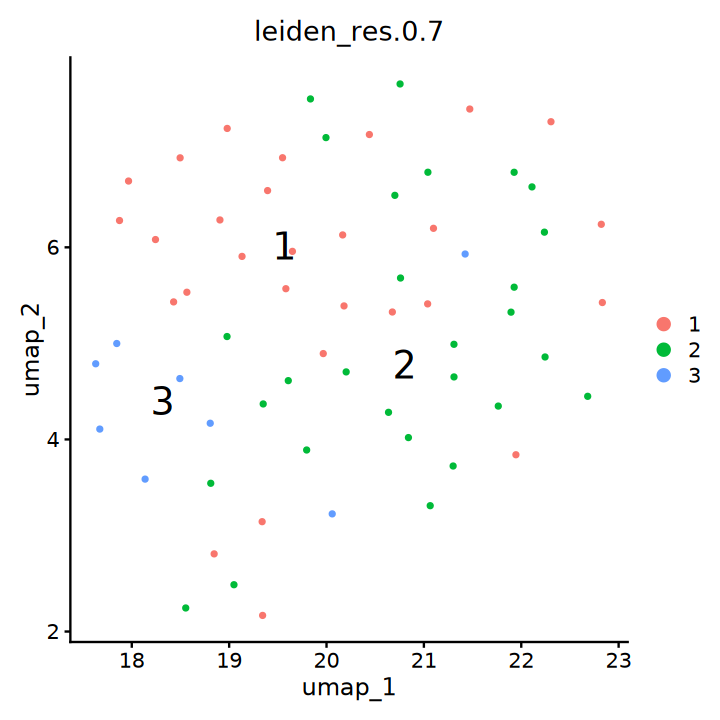

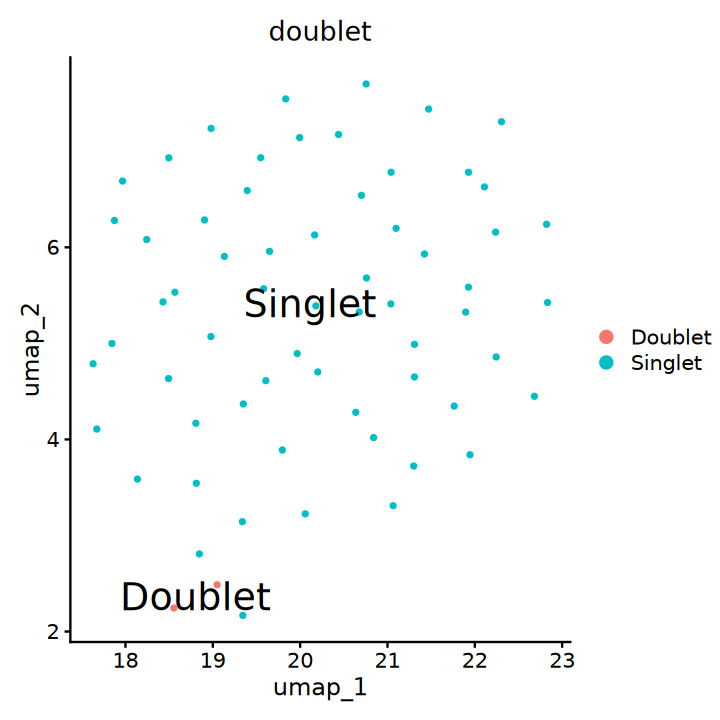

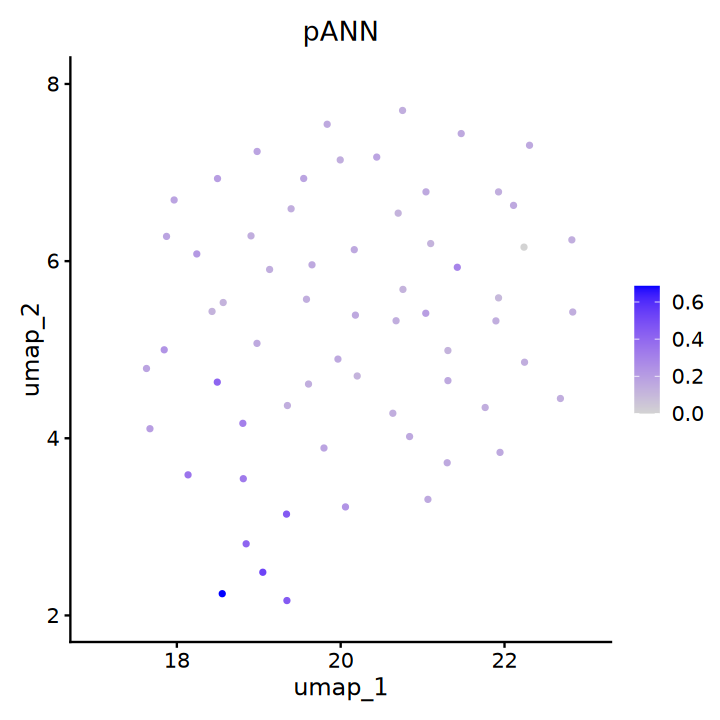

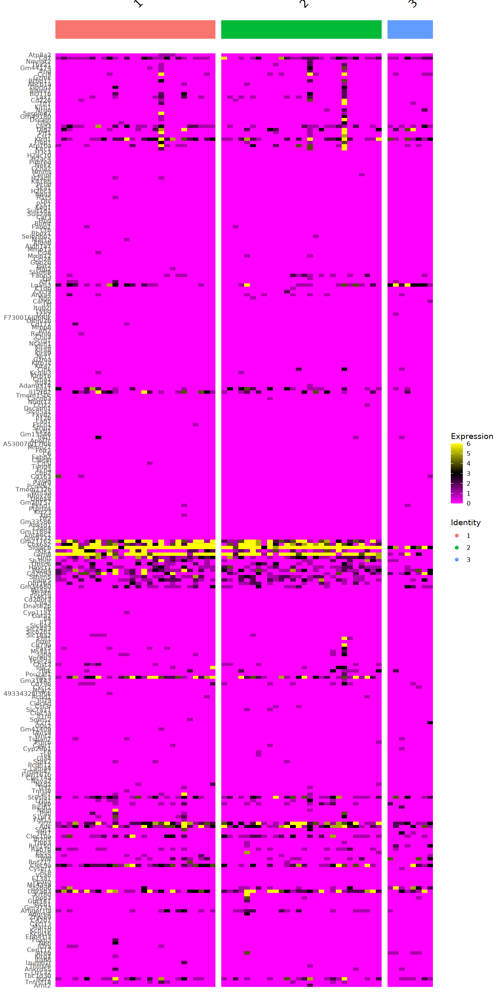

In [45]:
grp="leiden_res.0.7"

options(repr.plot.width=6, repr.plot.height=6)
DimPlot(seu, group.by=grp, label=T,label.size = 8)
DimPlot(seu, group.by="doublet", label=T,label.size = 8)
FeaturePlot(seu, features = "pANN")


# Top
markers.top  <- markers %>% group_by(cluster) %>% top_n(n = 15, wt = avg_log2FC)
options(repr.plot.width=10, repr.plot.height=20)
DoHeatmap(seu, features =markers.top$gene, slot="counts", group.by = grp )

In [46]:
barcodes<-colnames(seu)
putative_doublets<-unique(c(putative_doublets, barcodes))

#C13

In [47]:
seu <- seu_subsets[["13"]]

tic("Renormalization and Dimensionality reduction")
seu  <- NormalizeData(seu,  normalization.method="LogNormalize", scale.factor=10000, block.size=800)
seu  <- FindVariableFeatures(seu,  selection.method = "vst", nfeatures = 2000)

plan("multicore", workers = 54)
options(future.globals.maxSize = Inf)
seu <- ScaleData(seu,  features=rownames(seu), block.size = 500, min.cells.to.block = 1000)
plan("sequential")

seu <- RunPCA(seu,  npcs=30, features=VariableFeatures(object=seu),  verbose = FALSE)
seu <- RunUMAP(object=seu,  dims=1:30, verbose=FALSE, min.dist=0.5, n.neighbors = 30L, umap.method = "umap-learn", metric = "correlation")
toc()

seu <- FindNeighbors(seu, dims = 1:10, graph.name = 'leiden')
seu <- FindClusters(seu, resolution = c(0.1,0.3,0.5,0.7,0.9,1.2), algorithm=4, n.iter=100, group.singletons=T,graph.name = 'leiden')


seu -> seu_subsets[["13"]]

Normalizing layer: counts

Finding variable features for layer counts

Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“pseudoinverse used at -2.0997”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“neighborhood radius 0.50126”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“reciprocal condition number  3.7342e-16”
Warning message in simpleLoess(y, x, w, span, degree = degree, parametric = parametric, :
“There are other near singularities as well. 0.090619”
Centering and scaling data matrix



Renormalization and Dimensionality reduction: 15.755 sec elapsed


Computing nearest neighbor graph

Computing SNN

Only one graph name supplied, storing nearest-neighbor graph only



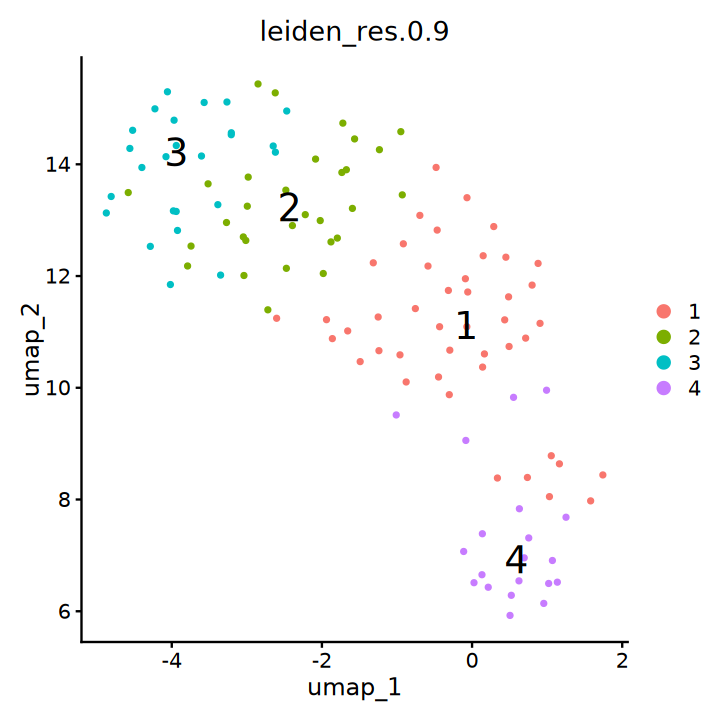

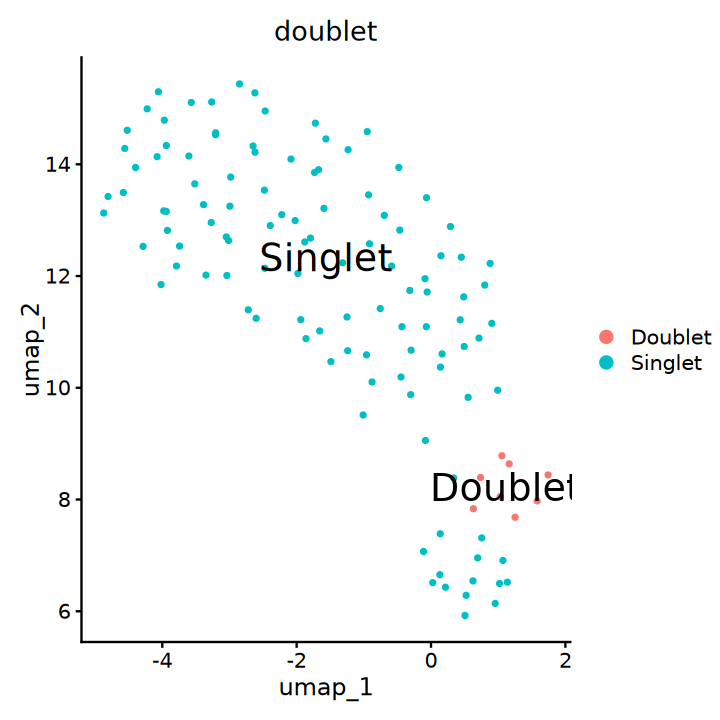

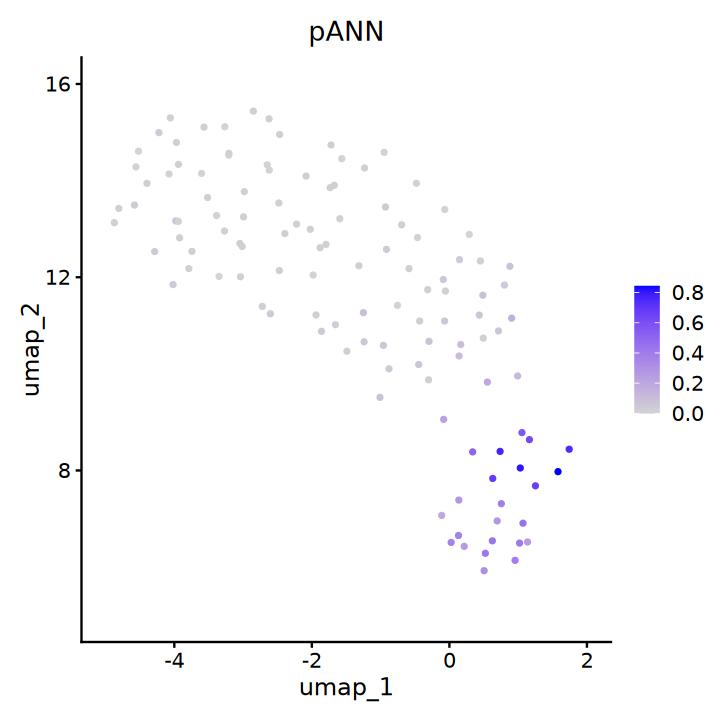

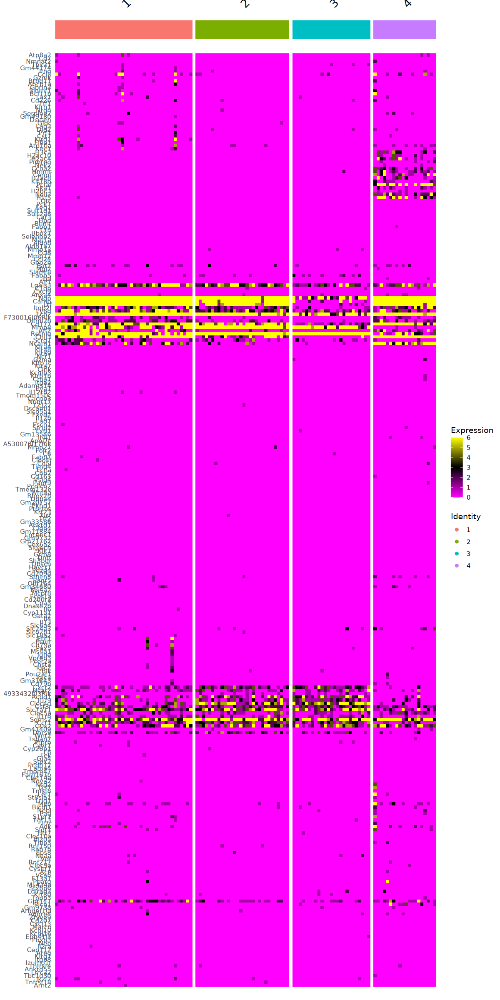

In [48]:
grp="leiden_res.0.9"

options(repr.plot.width=6, repr.plot.height=6)
DimPlot(seu, group.by=grp, label=T,label.size = 8)
DimPlot(seu, group.by="doublet", label=T,label.size = 8)
FeaturePlot(seu, features = "pANN")


# Top
markers.top  <- markers %>% group_by(cluster) %>% top_n(n = 15, wt = avg_log2FC)
options(repr.plot.width=10, repr.plot.height=20)
DoHeatmap(seu, features =markers.top$gene, slot="counts", group.by = grp )

In [49]:
barcodes<-colnames(subset(seu, leiden_res.0.9=="4"|doublet=="Doublet"))
putative_doublets<-unique(c(putative_doublets, barcodes))

In [50]:
length(putative_doublets)/ncol(seu.all)

[1] 0.09956767

In [51]:
save(putative_doublets,file = "/data3/Group8/gonglihao/1-MMP9/1-QC/shNC(multiplets).rda", compress=T)